<a href="https://colab.research.google.com/github/JVR27XD/MobileSAM/blob/main/Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 1. Montar Google Drive y definir rutas
from google.colab import drive
drive.mount('/content/drive')

RUTA_PROYECTO = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI"
LABELED_DIR = f"{RUTA_PROYECTO}/Labeled"
CHECKPOINTS_DIR = f"{RUTA_PROYECTO}/checkpoints"

import os
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)


Mounted at /content/drive


In [2]:
import os
os.makedirs("/content/drive/MyDrive/Colab Notebooks/SolDef_AI", exist_ok=True)


In [3]:
# 📦 2. Clonar Segment Anything Model (SAM)
!git clone https://github.com/facebookresearch/segment-anything.git
%cd segment-anything

Cloning into 'segment-anything'...
remote: Enumerating objects: 304, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 304 (delta 2), reused 2 (delta 2), pack-reused 299 (from 2)
Receiving objects: 100% (304/304), 18.31 MiB | 12.85 MiB/s, done.
Resolving deltas: 100% (159/159), done.
/content/segment-anything


Este bloque se encarga de preparar la carpeta donde se almacenarán los pesos preentrenados del modelo SAM.
Si el archivo ya está disponible en el directorio, lo reutiliza para ahorrar tiempo y recursos; si no, lo descarga automáticamente desde el repositorio oficial de Meta.

In [4]:
import os

CHECKPOINTS_DIR = "/content/checkpoints"
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)

checkpoint_path = f"{CHECKPOINTS_DIR}/sam_vit_b.pth"

if not os.path.exists(checkpoint_path):
    !wget -O "$checkpoint_path" https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
else:
    print(f"✅ Checkpoint ya existe en: {checkpoint_path}")


--2025-08-21 07:33:23--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.37.90, 13.35.37.84, 13.35.37.123, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.37.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘/content/checkpoints/sam_vit_b.pth’

/content/checkpoint 100%[===================>] 357.67M   331MB/s    in 1.1s    

2025-08-21 07:33:25 (331 MB/s) - ‘/content/checkpoints/sam_vit_b.pth’ saved [375042383/375042383]



# Carga y preparación del modelo SAM (ViT-B) para entrenamiento

Este bloque inicializa el modeloen su variante ViT-B utilizando los pesos previamente descargados. Además, configura el dispositivo de ejecución (CPU o GPU según disponibilidad) y coloca el modelo en modo entrenamiento, lo que permite realizar fine-tuning.

In [5]:
# Cargar modelo SAM
import torch
from segment_anything import sam_model_registry

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
sam = sam_model_registry['vit_b'](checkpoint=checkpoint_path)

sam.to(device=DEVICE)
sam.train()



Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    )


# Generación de máscaras binarias a partir de anotaciones JSON
Esta función convierte anotaciones vectoriales en formato JSON a máscaras binarias de tamaño fijo ($1024\times1024$). Se lee el archivo de anotaciones, se calculan los factores de escala entre la resolución original y la deseada, y se dibujan los polígonos correspondientes sobre una imagen en escala de grises. El resultado es una máscara binaria en la que los píxeles pertenecientes a la región anotada se representan con valor 1, y el fondo con valor 0. Este preprocesado permite estandarizar las entradas de entrenamiento para el ajuste fino del modelo.



In [6]:
# Función para generar máscaras desde JSON
import json
import numpy as np
from PIL import Image, ImageDraw

def mask_from_json(json_path, original_size, target_size=(1024, 1024)):

    with open(json_path) as f:
        data = json.load(f)

    # Escala entre imagen original y máscara final
    scale_x = target_size[0] / original_size[0]
    scale_y = target_size[1] / original_size[1]

    mask = Image.new("L", target_size, 0)
    draw = ImageDraw.Draw(mask)

    for shape in data.get("shapes", []):
        if shape["shape_type"] == "polygon":
            scaled_polygon = [
                (x * scale_x, y * scale_y) for x, y in shape["points"]
            ]
            draw.polygon(scaled_polygon, outline=1, fill=1)

    return mask



# Definición del conjunto de datos
A partir de los directorios que contienen imágenes en formato .jpg y sus anotaciones en .JSON, filtra únicamente aquellas muestras con anotación disponible. En cada acceso, carga la imagen RGB y genera la máscara binaria correspondiente dibujando los polígonos anotados mediante OpenCV. Tanto la imagen como la máscara se transforman en tensores.

In [7]:
import os
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
import cv2
import glob

class PCBDefectDataset(Dataset):
    def __init__(self, img_dir, json_dir, transform_image=None, transform_mask=None):
        self.img_dir = img_dir
        self.json_dir = json_dir
        self.transform_image = transform_image or ToTensor()
        self.transform_mask = transform_mask or ToTensor()

        # Buscar todas las imágenes .jpg recursivamente
        self.img_paths = glob.glob(os.path.join(img_dir, "**", "*.jpg"), recursive=True)

        # Filtrar las que tienen su .json correspondiente
        self.img_paths = [p for p in self.img_paths
                          if os.path.exists(os.path.join(json_dir, os.path.basename(p).replace(".jpg", ".json")))]

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        filename = os.path.basename(img_path)

        # Cargar imagen
        image = Image.open(img_path).convert("RGB")
        width, height = image.size

        # Inicializar máscara vacía
        mask = np.zeros((height, width), dtype=np.uint8)

        # Cargar anotación y dibujar máscara
        json_path = os.path.join(self.json_dir, filename.replace(".jpg", ".json"))
        if os.path.exists(json_path):
            with open(json_path, 'r') as f:
                data = json.load(f)
                for shape in data['shapes']:
                    if shape['shape_type'] == 'polygon':
                        points = np.array(shape['points'], dtype=np.int32)
                        cv2.fillPoly(mask, [points], color=1)

        # Convertir a tensores
        image = self.transform_image(image)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return image, mask





In [8]:
IMG_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Dataset"
JSON_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled"

dataset = PCBDefectDataset(IMG_DIR, JSON_DIR)
print(f"Total ejemplos: {len(dataset)}")
img, mask = dataset[0]
print("Image shape:", img.shape)
print("Mask shape:", mask.shape)



Total ejemplos: 428
Image shape: torch.Size([3, 1440, 2560])
Mask shape: torch.Size([1, 1440, 2560])


# Visualización de ejemplo

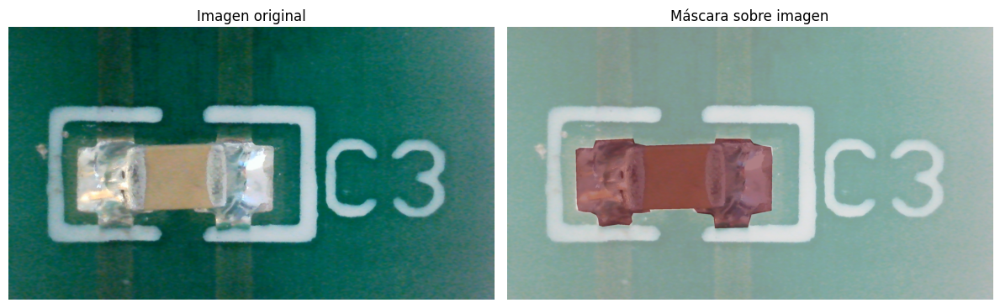

In [9]:
import matplotlib.pyplot as plt

def mostrar_ejemplo(dataset, idx=0):
    img, mask = dataset[idx]

    # Convertir imagen y máscara a numpy
    img_np = img.permute(1, 2, 0).numpy()
    mask_np = mask.squeeze().numpy()

    plt.figure(figsize=(12, 6))

    # Imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title("Imagen original")
    plt.axis("off")

    # Imagen con máscara superpuesta
    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(mask_np, alpha=0.5, cmap='Reds')
    plt.title("Máscara sobre imagen")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Visualizar uno
mostrar_ejemplo(dataset, idx=0)



In [10]:
from torch.utils.data import DataLoader

batch_size = 32
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)



# Bucle de entrenamiento del decodificador de máscaras (fine‑tuning parcial de SAM)


Este bloque define y ejecuta el entrenamiento ajustando solo el decodificador de máscaras de SAM. Primero congela todos los parámetros del modelo y habilita el gradiente únicamente en el decodificador; configura Adam (lr=1×10⁻⁴) y la pérdida BCE. Para cada imagen del batch genera un prompt positivo a partir del centroide de la máscara real, redimensiona la imagen a 1024×1024, obtiene la embedding del encoder sin gradiente y pasa los prompts por el prompt encoder y el decodificador. La salida se activa con sigmoide, se reescala al tamaño de la máscara y se calcula la pérdida para retropropagar solo sobre el decodificador. Al final de cada época calcula métricas (IoU, Dice, precisión y recall) sobre la última predicción, visualiza un ejemplo, guarda el checkpoint del decodificador y registra las métricas en CSV; las funciones auxiliares muestran predicciones y grafican la evolución de las métricas.



In [11]:
import matplotlib.pyplot as plt
from segment_anything.modeling import Sam
from torch.nn.functional import interpolate
import pandas as pd
import torch
import numpy as np

def train_sam_decoder(sam: Sam, dataloader, epochs=50, lr=1e-4, device="cuda"):
    for param in sam.parameters():
        param.requires_grad = False
    for param in sam.mask_decoder.parameters():
        param.requires_grad = True

    optimizer = torch.optim.Adam(sam.mask_decoder.parameters(), lr=lr)
    criterion = torch.nn.BCELoss()
    sam.to(device)
    sam.train()

    metrics_log = []

    for epoch in range(epochs):
        print(f"\n🔁 Epoch {epoch+1}/{epochs}")
        total_loss = 0.0

        for i, (images, masks_gt) in enumerate(dataloader):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image = images[b].unsqueeze(0)
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue
                point = coords.float().mean(dim=0)

                # ✅ Prompt en el formato correcto: (1, 1, 2)
                point_coords = point.unsqueeze(0).unsqueeze(0).to(dtype=torch.float32, device=device)
                point_labels = torch.tensor([[1]], dtype=torch.int, device=device)

                # === Resize imagen a 1024x1024 antes de encoder ===
                image_resized = interpolate(image, size=(1024, 1024), mode="bilinear", align_corners=False)

                # === Paso por encoder SAM ===
                with torch.no_grad():
                    image_embedding = sam.image_encoder(image_resized)

                sparse_embeddings, dense_embeddings = sam.prompt_encoder(
                    points=(point_coords, point_labels),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_tensor = interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")

                loss = criterion(mask_pred_tensor, mask_gt.unsqueeze(0))

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

                ultima_image = image[0].permute(1, 2, 0).detach().cpu().numpy()
                ultima_gt = mask_gt[0].detach().cpu().numpy()
                ultima_pred = mask_pred_tensor[0, 0].detach().cpu().numpy()

            if i % 10 == 0:
                print(f"  [Batch {i}/{len(dataloader)}] Loss: {loss.item():.4f}")

        avg_loss = total_loss / len(dataloader)
        print(f"✅ Epoch {epoch+1} finished. Avg Loss: {avg_loss:.4f}")

        pred_bin = (mask_pred_tensor > 0.5).float()
        gt_bin = (mask_gt.unsqueeze(0) > 0.5).float()

        intersection = (pred_bin * gt_bin).sum().item()
        union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
        pred_sum = pred_bin.sum().item()
        gt_sum = gt_bin.sum().item()

        iou = intersection / (union + 1e-7)
        dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
        precision = intersection / (pred_sum + 1e-7)
        recall = intersection / (gt_sum + 1e-7)

        print(f"📊 Métricas — IoU: {iou:.4f} | Dice: {dice:.4f} | Prec: {precision:.4f} | Rec: {recall:.4f}")

        metrics_log.append({
            "epoch": epoch + 1,
            "loss": avg_loss,
            "iou": iou,
            "dice": dice,
            "precision": precision,
            "recall": recall
        })

        mostrar_prediccion(ultima_image, ultima_gt, ultima_pred)

        decoder_path = f"sam_decoder_epoch{epoch+1}.pth"
        torch.save(sam.mask_decoder.state_dict(), decoder_path)
        print(f"💾 Decoder guardado: {decoder_path}")

    df = pd.DataFrame(metrics_log)
    df.to_csv("sam_decoder_metrics.csv", index=False)
    print("📁 Métricas guardadas en 'sam_decoder_metrics.csv'")

    graficar_metricas(df)


def mostrar_prediccion(image, gt_mask, pred_mask):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Imagen")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask, cmap="gray")
    plt.title("Máscara GT")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap="Reds")
    plt.title("Predicción")

    plt.tight_layout()
    plt.show()


def graficar_metricas(df):
    plt.figure(figsize=(12, 8))
    for i, metric in enumerate(["loss", "iou", "dice", "precision", "recall"]):
        plt.subplot(2, 3, i + 1)
        plt.plot(df["epoch"], df[metric], marker="o")
        plt.title(metric.capitalize())
        plt.xlabel("Epoch")
        plt.grid(True)

    plt.tight_layout()
    plt.show()










🔁 Epoch 1/50
  [Batch 0/14] Loss: 0.0282
  [Batch 10/14] Loss: 0.0456
✅ Epoch 1 finished. Avg Loss: 2.2345
📊 Métricas — IoU: 0.9553 | Dice: 0.9771 | Prec: 0.9809 | Rec: 0.9733


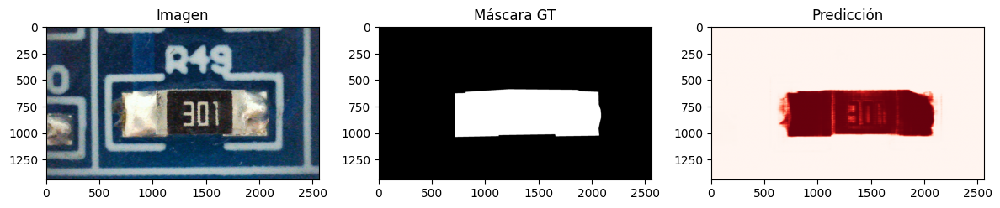

💾 Decoder guardado: sam_decoder_epoch1.pth

🔁 Epoch 2/50
  [Batch 0/14] Loss: 0.0212
  [Batch 10/14] Loss: 0.0067
✅ Epoch 2 finished. Avg Loss: 0.9861
📊 Métricas — IoU: 0.9626 | Dice: 0.9810 | Prec: 0.9864 | Rec: 0.9755


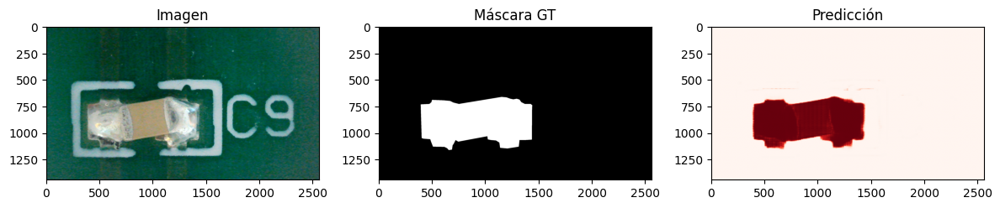

💾 Decoder guardado: sam_decoder_epoch2.pth

🔁 Epoch 3/50
  [Batch 0/14] Loss: 0.0292
  [Batch 10/14] Loss: 0.0427
✅ Epoch 3 finished. Avg Loss: 0.7189
📊 Métricas — IoU: 0.8748 | Dice: 0.9332 | Prec: 0.9066 | Rec: 0.9614


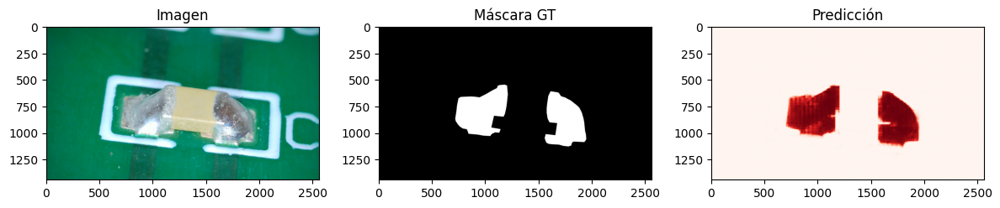

💾 Decoder guardado: sam_decoder_epoch3.pth

🔁 Epoch 4/50
  [Batch 0/14] Loss: 0.0059
  [Batch 10/14] Loss: 0.0435
✅ Epoch 4 finished. Avg Loss: 0.8851
📊 Métricas — IoU: 0.9494 | Dice: 0.9741 | Prec: 0.9692 | Rec: 0.9789


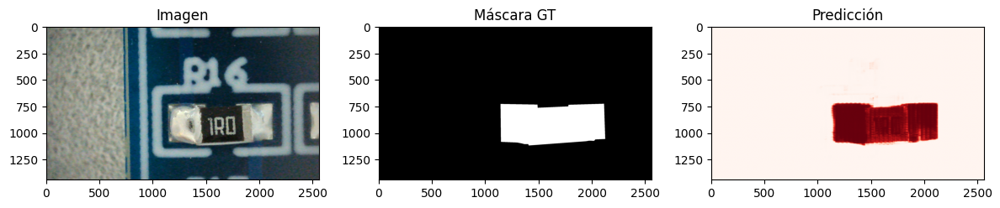

💾 Decoder guardado: sam_decoder_epoch4.pth

🔁 Epoch 5/50
  [Batch 0/14] Loss: 0.0394
  [Batch 10/14] Loss: 0.0187
✅ Epoch 5 finished. Avg Loss: 0.6636
📊 Métricas — IoU: 0.9222 | Dice: 0.9595 | Prec: 0.9881 | Rec: 0.9326


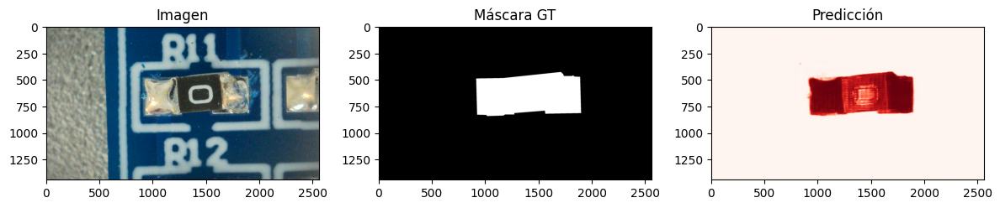

💾 Decoder guardado: sam_decoder_epoch5.pth

🔁 Epoch 6/50
  [Batch 0/14] Loss: 0.0048
  [Batch 10/14] Loss: 0.0255
✅ Epoch 6 finished. Avg Loss: 0.5741
📊 Métricas — IoU: 0.9670 | Dice: 0.9832 | Prec: 0.9686 | Rec: 0.9982


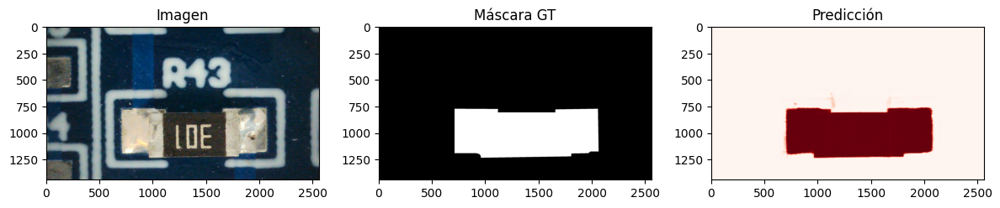

💾 Decoder guardado: sam_decoder_epoch6.pth

🔁 Epoch 7/50
  [Batch 0/14] Loss: 0.0277
  [Batch 10/14] Loss: 0.0118
✅ Epoch 7 finished. Avg Loss: 0.5629
📊 Métricas — IoU: 0.9787 | Dice: 0.9893 | Prec: 0.9860 | Rec: 0.9926


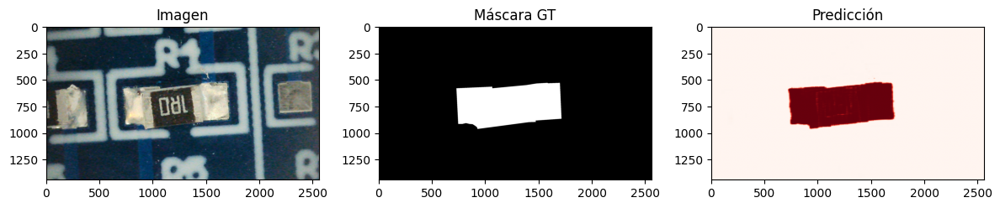

💾 Decoder guardado: sam_decoder_epoch7.pth

🔁 Epoch 8/50
  [Batch 0/14] Loss: 0.0050
  [Batch 10/14] Loss: 0.0170
✅ Epoch 8 finished. Avg Loss: 0.5052
📊 Métricas — IoU: 0.9592 | Dice: 0.9792 | Prec: 0.9642 | Rec: 0.9946


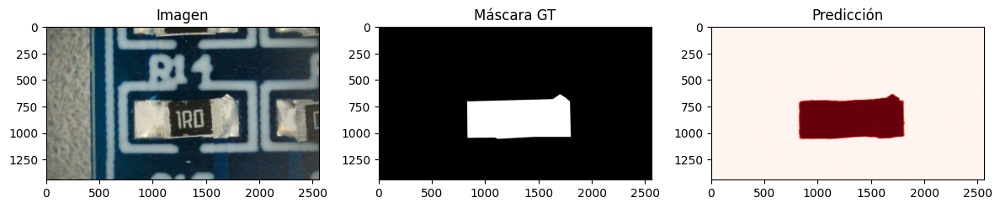

💾 Decoder guardado: sam_decoder_epoch8.pth

🔁 Epoch 9/50
  [Batch 0/14] Loss: 0.0459
  [Batch 10/14] Loss: 0.0103
✅ Epoch 9 finished. Avg Loss: 0.5259
📊 Métricas — IoU: 0.9002 | Dice: 0.9475 | Prec: 0.9245 | Rec: 0.9717


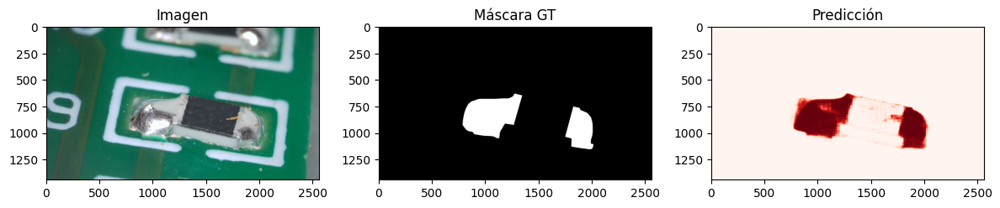

💾 Decoder guardado: sam_decoder_epoch9.pth

🔁 Epoch 10/50
  [Batch 0/14] Loss: 0.0135
  [Batch 10/14] Loss: 0.0071
✅ Epoch 10 finished. Avg Loss: 0.4880
📊 Métricas — IoU: 0.9758 | Dice: 0.9878 | Prec: 0.9959 | Rec: 0.9797


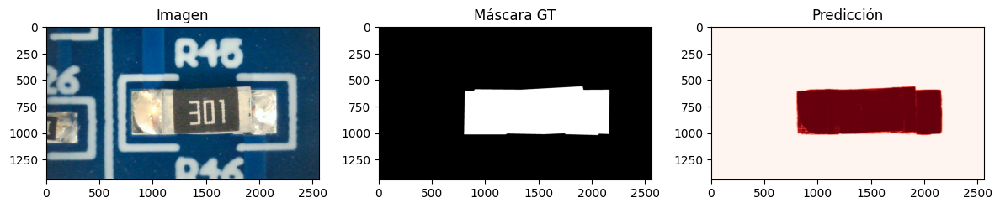

💾 Decoder guardado: sam_decoder_epoch10.pth

🔁 Epoch 11/50
  [Batch 0/14] Loss: 0.0322
  [Batch 10/14] Loss: 0.0263
✅ Epoch 11 finished. Avg Loss: 0.6794
📊 Métricas — IoU: 0.9697 | Dice: 0.9846 | Prec: 0.9859 | Rec: 0.9834


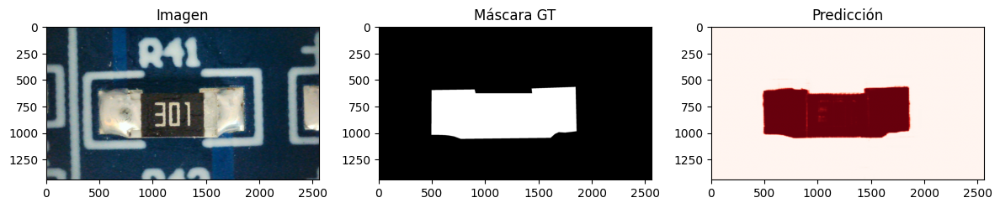

💾 Decoder guardado: sam_decoder_epoch11.pth

🔁 Epoch 12/50
  [Batch 0/14] Loss: 0.0103
  [Batch 10/14] Loss: 0.0065
✅ Epoch 12 finished. Avg Loss: 0.4895
📊 Métricas — IoU: 0.8717 | Dice: 0.9315 | Prec: 0.9393 | Rec: 0.9237


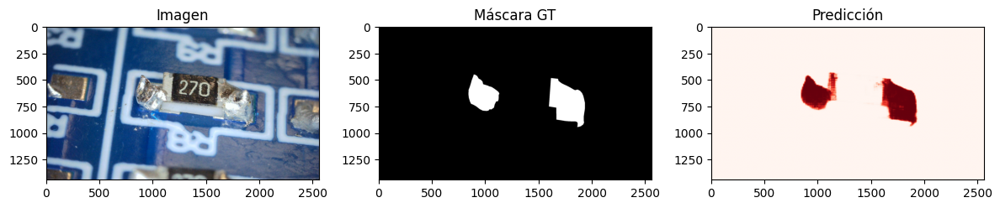

💾 Decoder guardado: sam_decoder_epoch12.pth

🔁 Epoch 13/50
  [Batch 0/14] Loss: 0.0121
  [Batch 10/14] Loss: 0.0080
✅ Epoch 13 finished. Avg Loss: 0.4331
📊 Métricas — IoU: 0.8476 | Dice: 0.9175 | Prec: 0.9031 | Rec: 0.9324


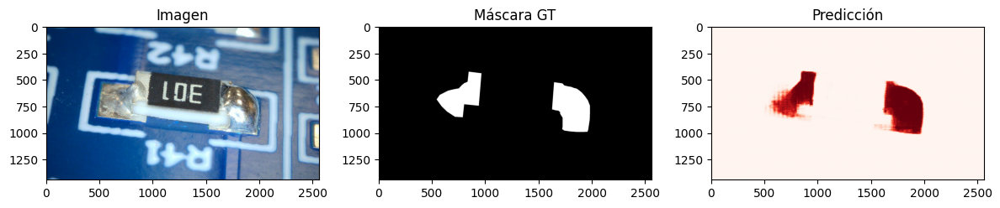

💾 Decoder guardado: sam_decoder_epoch13.pth

🔁 Epoch 14/50
  [Batch 0/14] Loss: 0.0110
  [Batch 10/14] Loss: 0.0052
✅ Epoch 14 finished. Avg Loss: 0.4166
📊 Métricas — IoU: 0.9671 | Dice: 0.9833 | Prec: 0.9913 | Rec: 0.9754


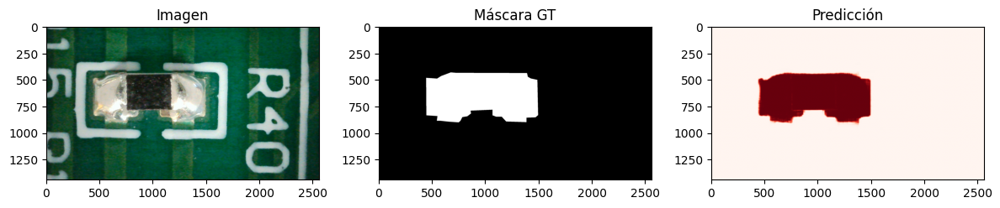

💾 Decoder guardado: sam_decoder_epoch14.pth

🔁 Epoch 15/50
  [Batch 0/14] Loss: 0.0130
  [Batch 10/14] Loss: 0.0190
✅ Epoch 15 finished. Avg Loss: 0.4012
📊 Métricas — IoU: 0.8923 | Dice: 0.9431 | Prec: 0.9075 | Rec: 0.9815


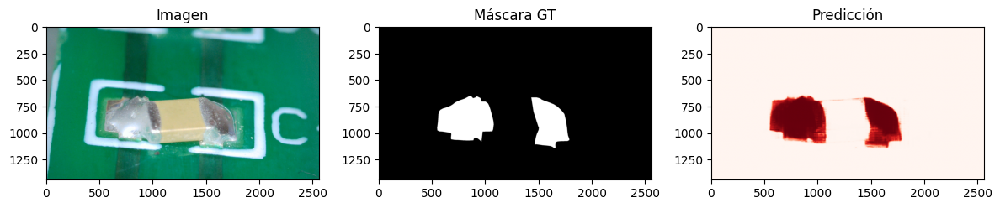

💾 Decoder guardado: sam_decoder_epoch15.pth

🔁 Epoch 16/50
  [Batch 0/14] Loss: 0.0113
  [Batch 10/14] Loss: 0.0094
✅ Epoch 16 finished. Avg Loss: 0.4082
📊 Métricas — IoU: 0.8466 | Dice: 0.9169 | Prec: 0.9519 | Rec: 0.8845


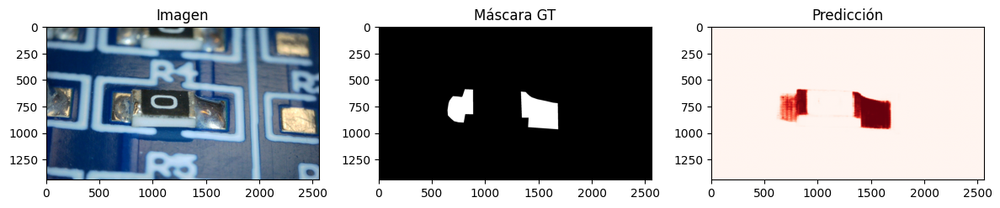

💾 Decoder guardado: sam_decoder_epoch16.pth

🔁 Epoch 17/50
  [Batch 0/14] Loss: 0.0074
  [Batch 10/14] Loss: 0.0142
✅ Epoch 17 finished. Avg Loss: 0.4031
📊 Métricas — IoU: 0.9585 | Dice: 0.9788 | Prec: 0.9703 | Rec: 0.9875


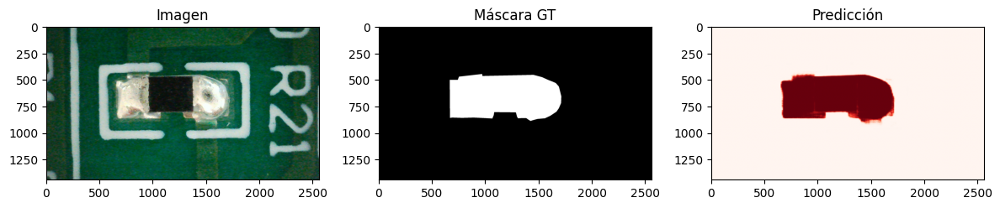

💾 Decoder guardado: sam_decoder_epoch17.pth

🔁 Epoch 18/50
  [Batch 0/14] Loss: 0.0109
  [Batch 10/14] Loss: 0.0071
✅ Epoch 18 finished. Avg Loss: 0.4234
📊 Métricas — IoU: 0.9823 | Dice: 0.9911 | Prec: 0.9896 | Rec: 0.9926


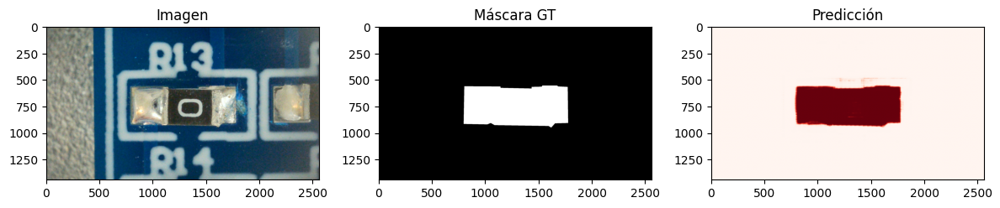

💾 Decoder guardado: sam_decoder_epoch18.pth

🔁 Epoch 19/50
  [Batch 0/14] Loss: 0.0112
  [Batch 10/14] Loss: 0.1083
✅ Epoch 19 finished. Avg Loss: 0.7573
📊 Métricas — IoU: 0.9690 | Dice: 0.9843 | Prec: 0.9937 | Rec: 0.9750


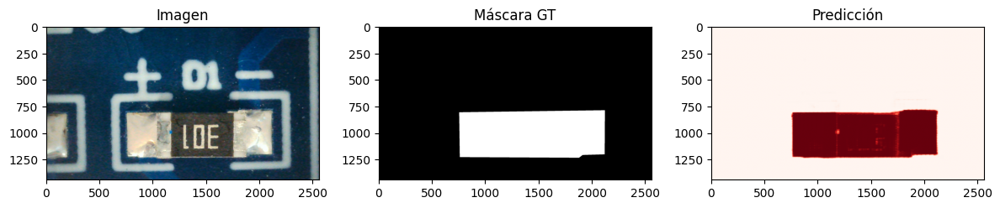

💾 Decoder guardado: sam_decoder_epoch19.pth

🔁 Epoch 20/50
  [Batch 0/14] Loss: 0.0135
  [Batch 10/14] Loss: 0.0257
✅ Epoch 20 finished. Avg Loss: 0.4668
📊 Métricas — IoU: 0.8592 | Dice: 0.9243 | Prec: 0.9309 | Rec: 0.9177


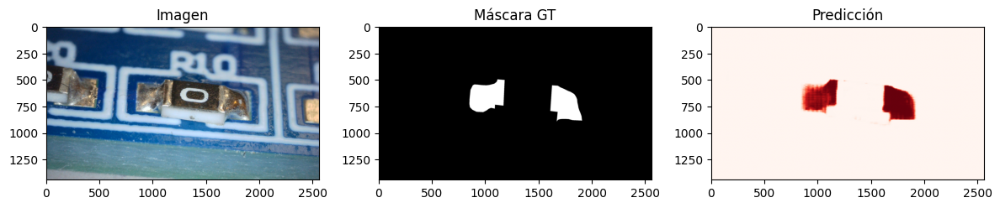

💾 Decoder guardado: sam_decoder_epoch20.pth

🔁 Epoch 21/50
  [Batch 0/14] Loss: 0.0150
  [Batch 10/14] Loss: 0.0098
✅ Epoch 21 finished. Avg Loss: 0.4438
📊 Métricas — IoU: 0.8273 | Dice: 0.9055 | Prec: 0.8368 | Rec: 0.9864


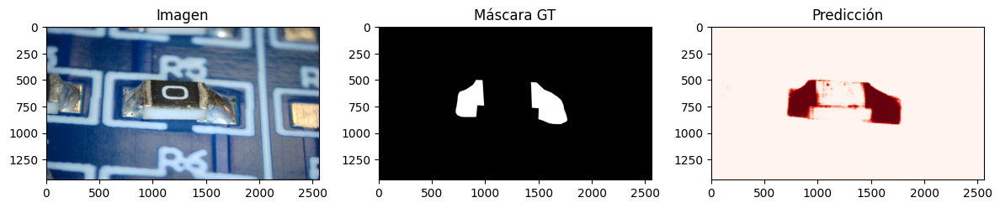

💾 Decoder guardado: sam_decoder_epoch21.pth

🔁 Epoch 22/50
  [Batch 0/14] Loss: 0.0065
  [Batch 10/14] Loss: 0.0072
✅ Epoch 22 finished. Avg Loss: 0.4240
📊 Métricas — IoU: 0.9674 | Dice: 0.9835 | Prec: 0.9808 | Rec: 0.9861


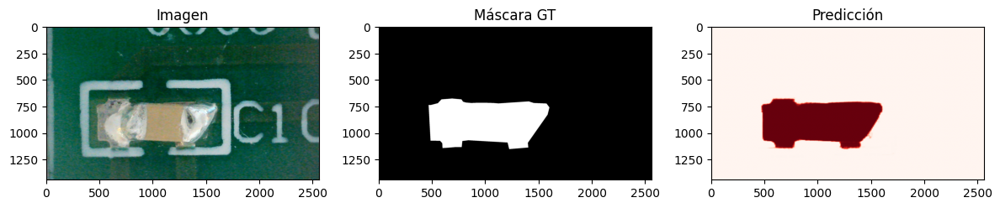

💾 Decoder guardado: sam_decoder_epoch22.pth

🔁 Epoch 23/50
  [Batch 0/14] Loss: 0.0062
  [Batch 10/14] Loss: 0.0155
✅ Epoch 23 finished. Avg Loss: 0.3727
📊 Métricas — IoU: 0.9744 | Dice: 0.9870 | Prec: 0.9892 | Rec: 0.9849


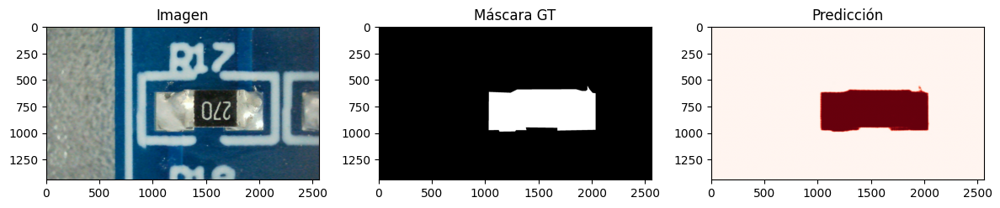

💾 Decoder guardado: sam_decoder_epoch23.pth

🔁 Epoch 24/50
  [Batch 0/14] Loss: 0.0069
  [Batch 10/14] Loss: 0.0194
✅ Epoch 24 finished. Avg Loss: 0.3555
📊 Métricas — IoU: 0.9659 | Dice: 0.9827 | Prec: 0.9828 | Rec: 0.9825


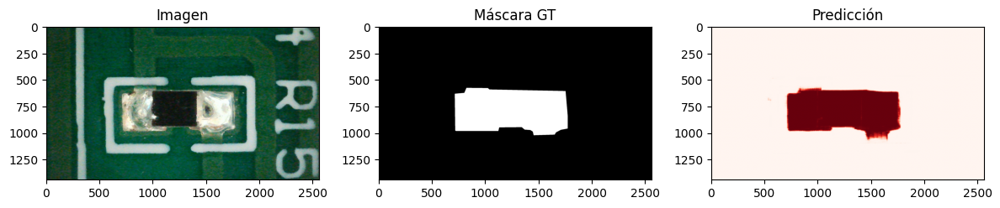

💾 Decoder guardado: sam_decoder_epoch24.pth

🔁 Epoch 25/50
  [Batch 0/14] Loss: 0.0138
  [Batch 10/14] Loss: 0.0069
✅ Epoch 25 finished. Avg Loss: 0.3893
📊 Métricas — IoU: 0.9555 | Dice: 0.9773 | Prec: 0.9573 | Rec: 0.9980


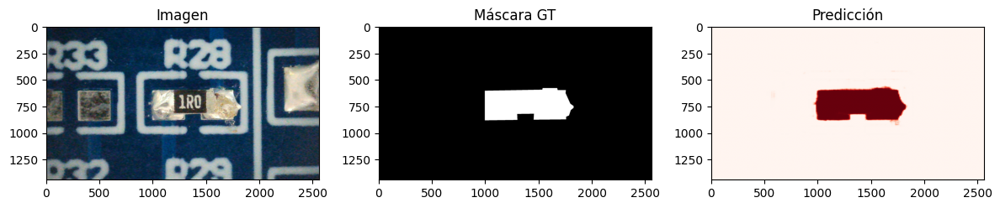

💾 Decoder guardado: sam_decoder_epoch25.pth

🔁 Epoch 26/50
  [Batch 0/14] Loss: 0.0232
  [Batch 10/14] Loss: 0.0083
✅ Epoch 26 finished. Avg Loss: 0.4721
📊 Métricas — IoU: 0.9026 | Dice: 0.9488 | Prec: 0.9592 | Rec: 0.9386


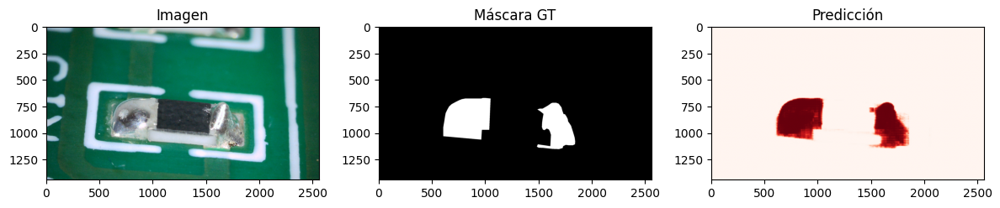

💾 Decoder guardado: sam_decoder_epoch26.pth

🔁 Epoch 27/50
  [Batch 0/14] Loss: 0.0236
  [Batch 10/14] Loss: 0.0110
✅ Epoch 27 finished. Avg Loss: 0.4179
📊 Métricas — IoU: 0.9487 | Dice: 0.9737 | Prec: 0.9893 | Rec: 0.9586


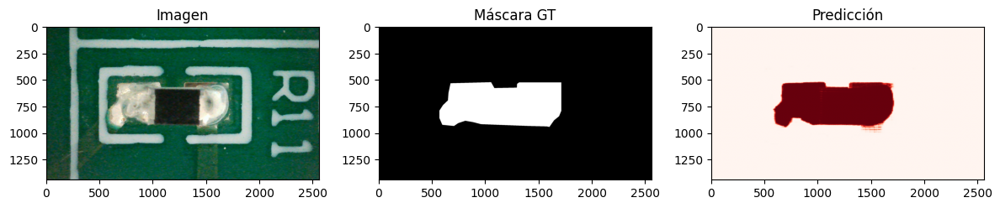

💾 Decoder guardado: sam_decoder_epoch27.pth

🔁 Epoch 28/50
  [Batch 0/14] Loss: 0.0034
  [Batch 10/14] Loss: 0.0102
✅ Epoch 28 finished. Avg Loss: 0.3617
📊 Métricas — IoU: 0.8066 | Dice: 0.8930 | Prec: 0.8750 | Rec: 0.9117


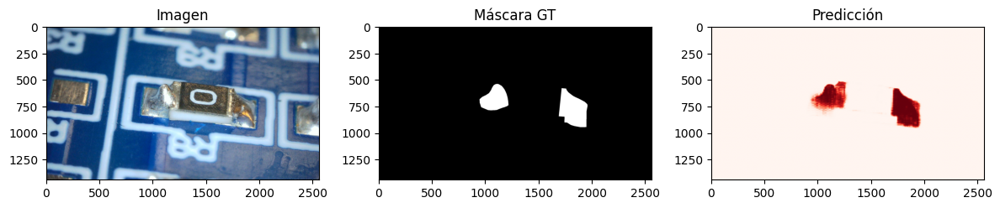

💾 Decoder guardado: sam_decoder_epoch28.pth

🔁 Epoch 29/50
  [Batch 0/14] Loss: 0.0103
  [Batch 10/14] Loss: 0.0094
✅ Epoch 29 finished. Avg Loss: 0.3537
📊 Métricas — IoU: 0.9123 | Dice: 0.9541 | Prec: 0.9841 | Rec: 0.9259


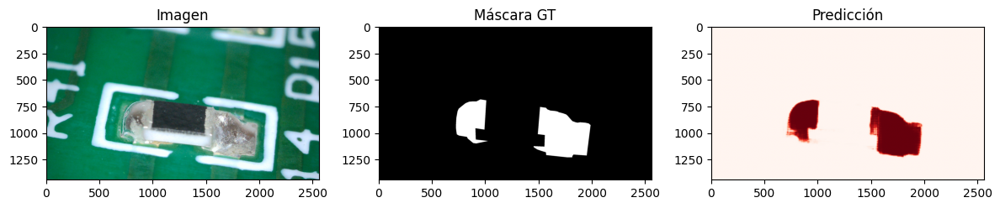

💾 Decoder guardado: sam_decoder_epoch29.pth

🔁 Epoch 30/50
  [Batch 0/14] Loss: 0.0044
  [Batch 10/14] Loss: 0.0145
✅ Epoch 30 finished. Avg Loss: 0.3498
📊 Métricas — IoU: 0.9722 | Dice: 0.9859 | Prec: 0.9918 | Rec: 0.9800


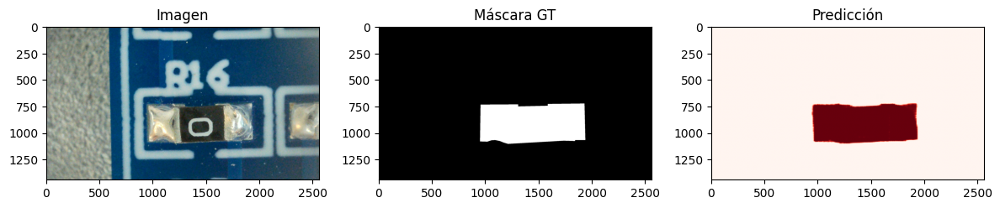

💾 Decoder guardado: sam_decoder_epoch30.pth

🔁 Epoch 31/50
  [Batch 0/14] Loss: 0.0065
  [Batch 10/14] Loss: 0.0195
✅ Epoch 31 finished. Avg Loss: 0.3529
📊 Métricas — IoU: 0.9797 | Dice: 0.9898 | Prec: 0.9883 | Rec: 0.9913


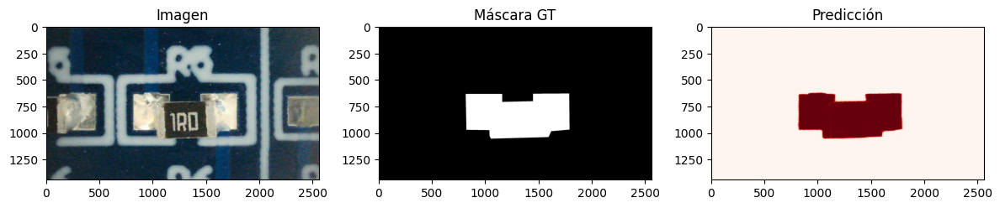

💾 Decoder guardado: sam_decoder_epoch31.pth

🔁 Epoch 32/50
  [Batch 0/14] Loss: 0.0042
  [Batch 10/14] Loss: 0.0086
✅ Epoch 32 finished. Avg Loss: 0.3652
📊 Métricas — IoU: 0.9780 | Dice: 0.9889 | Prec: 0.9937 | Rec: 0.9841


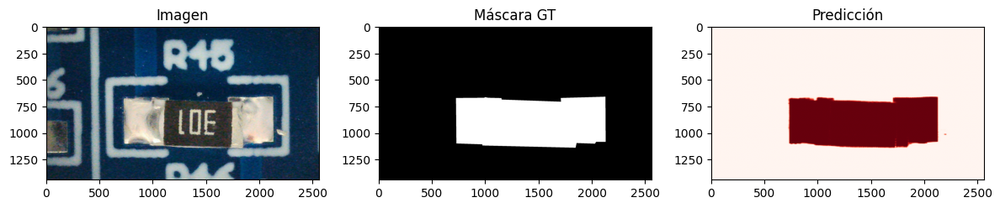

💾 Decoder guardado: sam_decoder_epoch32.pth

🔁 Epoch 33/50
  [Batch 0/14] Loss: 0.0034
  [Batch 10/14] Loss: 0.0147
✅ Epoch 33 finished. Avg Loss: 0.3318
📊 Métricas — IoU: 0.9088 | Dice: 0.9522 | Prec: 0.9301 | Rec: 0.9754


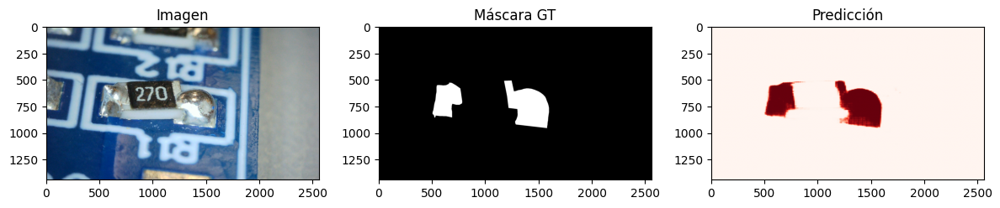

💾 Decoder guardado: sam_decoder_epoch33.pth

🔁 Epoch 34/50
  [Batch 0/14] Loss: 0.0072
  [Batch 10/14] Loss: 0.0140
✅ Epoch 34 finished. Avg Loss: 0.3258
📊 Métricas — IoU: 0.8525 | Dice: 0.9204 | Prec: 0.8940 | Rec: 0.9484


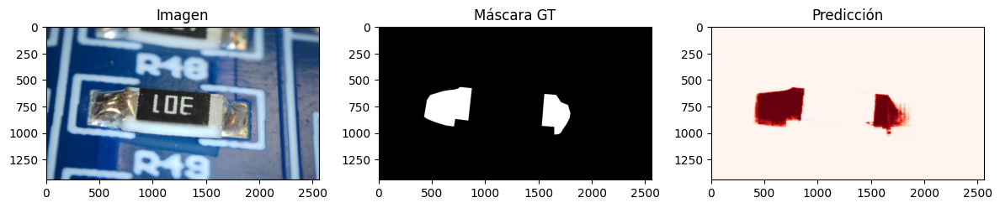

💾 Decoder guardado: sam_decoder_epoch34.pth

🔁 Epoch 35/50
  [Batch 0/14] Loss: 0.0055
  [Batch 10/14] Loss: 0.0101
✅ Epoch 35 finished. Avg Loss: 0.3270
📊 Métricas — IoU: 0.8375 | Dice: 0.9116 | Prec: 0.8515 | Rec: 0.9808


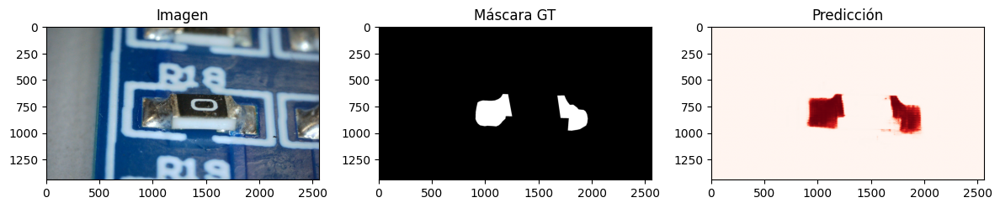

💾 Decoder guardado: sam_decoder_epoch35.pth

🔁 Epoch 36/50
  [Batch 0/14] Loss: 0.0062
  [Batch 10/14] Loss: 0.0089
✅ Epoch 36 finished. Avg Loss: 0.3361
📊 Métricas — IoU: 0.8580 | Dice: 0.9236 | Prec: 0.8961 | Rec: 0.9528


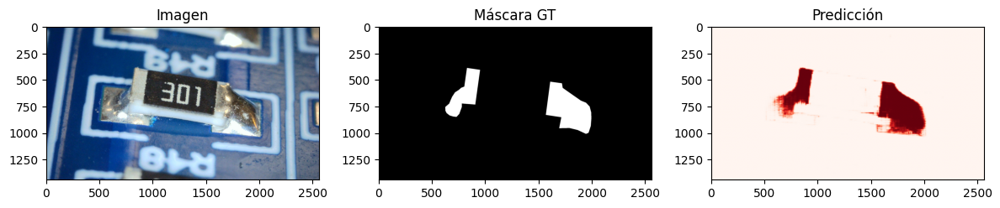

💾 Decoder guardado: sam_decoder_epoch36.pth

🔁 Epoch 37/50
  [Batch 0/14] Loss: 0.0086
  [Batch 10/14] Loss: 0.0104
✅ Epoch 37 finished. Avg Loss: 0.3113
📊 Métricas — IoU: 0.9541 | Dice: 0.9765 | Prec: 0.9659 | Rec: 0.9874


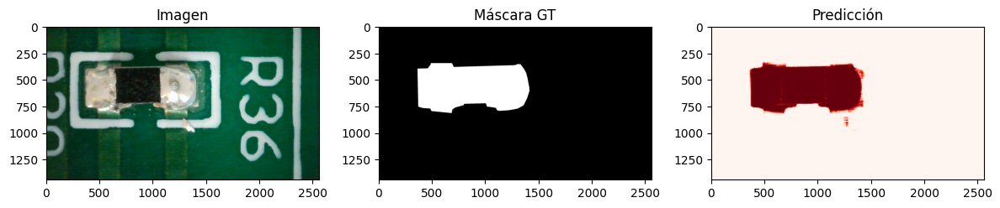

💾 Decoder guardado: sam_decoder_epoch37.pth

🔁 Epoch 38/50
  [Batch 0/14] Loss: 0.0113
  [Batch 10/14] Loss: 0.0149
✅ Epoch 38 finished. Avg Loss: 0.3348
📊 Métricas — IoU: 0.9871 | Dice: 0.9935 | Prec: 0.9926 | Rec: 0.9945


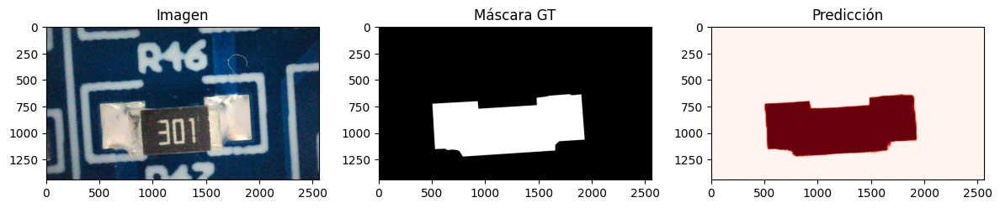

💾 Decoder guardado: sam_decoder_epoch38.pth

🔁 Epoch 39/50
  [Batch 0/14] Loss: 0.0152
  [Batch 10/14] Loss: 0.0066
✅ Epoch 39 finished. Avg Loss: 0.3676
📊 Métricas — IoU: 0.9016 | Dice: 0.9483 | Prec: 0.9339 | Rec: 0.9631


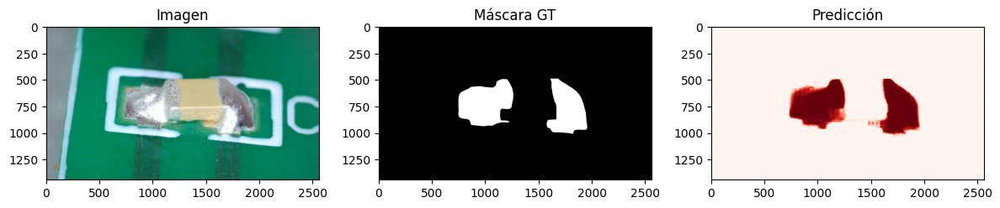

💾 Decoder guardado: sam_decoder_epoch39.pth

🔁 Epoch 40/50
  [Batch 0/14] Loss: 0.0080
  [Batch 10/14] Loss: 0.0068
✅ Epoch 40 finished. Avg Loss: 0.3174
📊 Métricas — IoU: 0.9078 | Dice: 0.9517 | Prec: 0.9531 | Rec: 0.9503


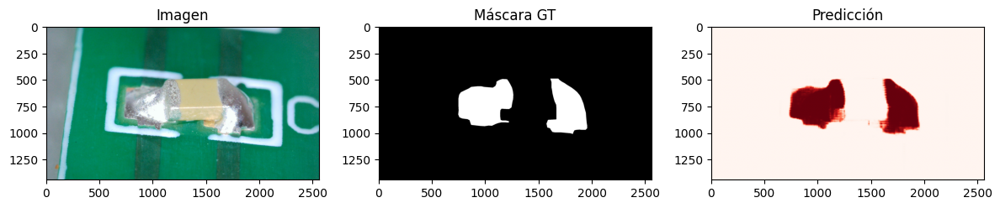

💾 Decoder guardado: sam_decoder_epoch40.pth

🔁 Epoch 41/50
  [Batch 0/14] Loss: 0.0072
  [Batch 10/14] Loss: 0.0103
✅ Epoch 41 finished. Avg Loss: 0.3011
📊 Métricas — IoU: 0.9171 | Dice: 0.9568 | Prec: 0.9405 | Rec: 0.9736


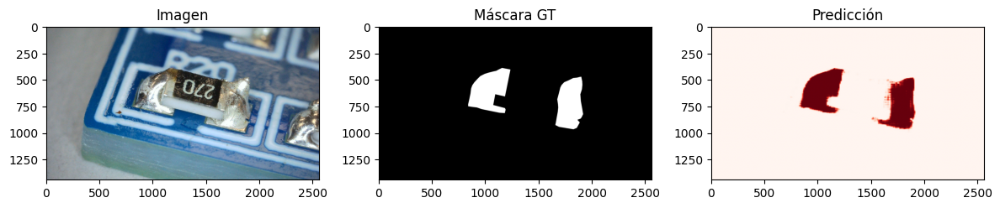

💾 Decoder guardado: sam_decoder_epoch41.pth

🔁 Epoch 42/50
  [Batch 0/14] Loss: 0.0070
  [Batch 10/14] Loss: 0.0096
✅ Epoch 42 finished. Avg Loss: 0.2942
📊 Métricas — IoU: 0.9895 | Dice: 0.9947 | Prec: 0.9944 | Rec: 0.9951


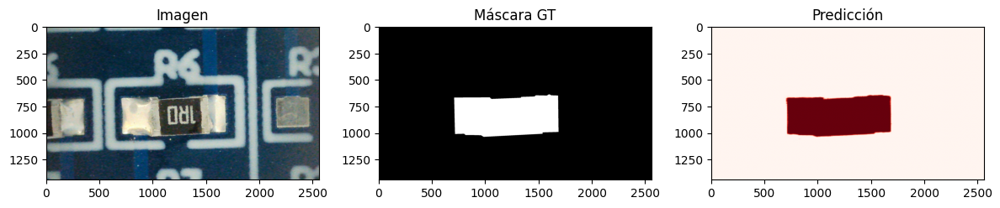

💾 Decoder guardado: sam_decoder_epoch42.pth

🔁 Epoch 43/50
  [Batch 0/14] Loss: 0.0054
  [Batch 10/14] Loss: 0.0182
✅ Epoch 43 finished. Avg Loss: 0.2942
📊 Métricas — IoU: 0.9180 | Dice: 0.9573 | Prec: 0.9386 | Rec: 0.9767


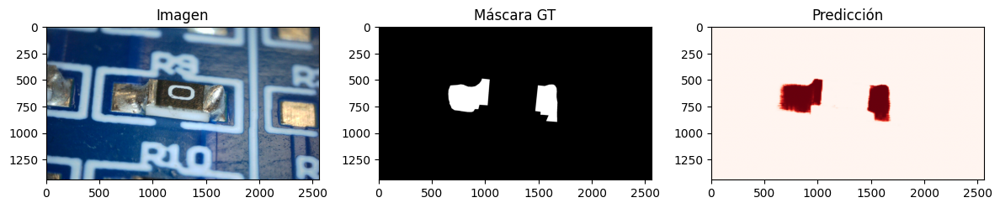

💾 Decoder guardado: sam_decoder_epoch43.pth

🔁 Epoch 44/50
  [Batch 0/14] Loss: 0.0074
  [Batch 10/14] Loss: 0.0086
✅ Epoch 44 finished. Avg Loss: 0.2937
📊 Métricas — IoU: 0.8404 | Dice: 0.9133 | Prec: 0.9246 | Rec: 0.9022


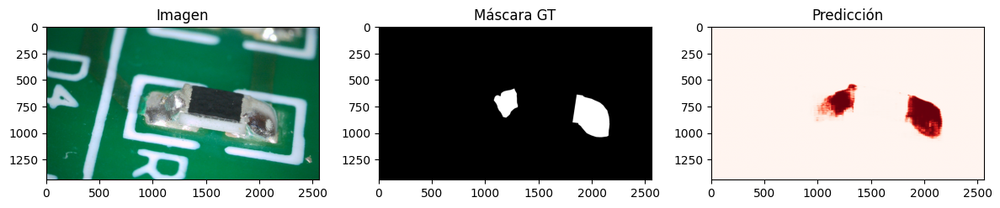

💾 Decoder guardado: sam_decoder_epoch44.pth

🔁 Epoch 45/50
  [Batch 0/14] Loss: 0.0049
  [Batch 10/14] Loss: 0.0052
✅ Epoch 45 finished. Avg Loss: 0.2792
📊 Métricas — IoU: 0.9482 | Dice: 0.9734 | Prec: 0.9846 | Rec: 0.9625


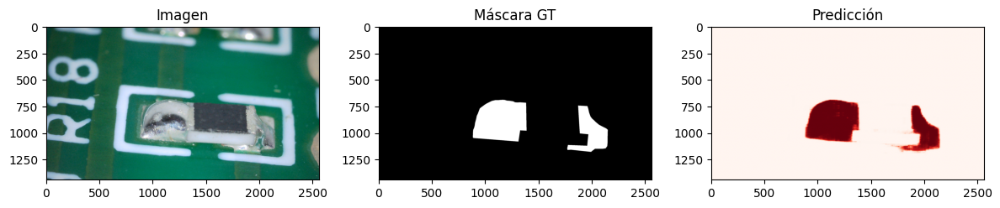

💾 Decoder guardado: sam_decoder_epoch45.pth

🔁 Epoch 46/50
  [Batch 0/14] Loss: 0.0073
  [Batch 10/14] Loss: 0.0041
✅ Epoch 46 finished. Avg Loss: 0.2788
📊 Métricas — IoU: 0.9113 | Dice: 0.9536 | Prec: 0.9899 | Rec: 0.9199


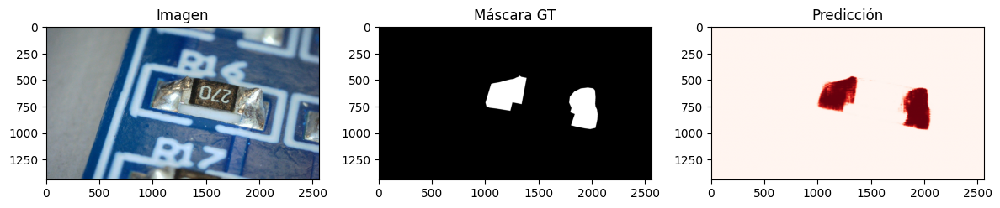

💾 Decoder guardado: sam_decoder_epoch46.pth

🔁 Epoch 47/50
  [Batch 0/14] Loss: 0.0059
  [Batch 10/14] Loss: 0.0088
✅ Epoch 47 finished. Avg Loss: 0.2730
📊 Métricas — IoU: 0.8883 | Dice: 0.9408 | Prec: 0.9331 | Rec: 0.9487


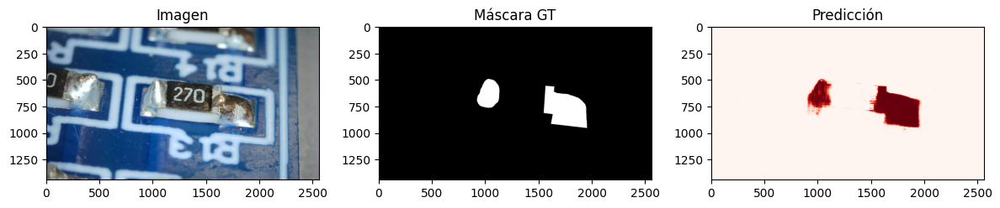

💾 Decoder guardado: sam_decoder_epoch47.pth

🔁 Epoch 48/50
  [Batch 0/14] Loss: 0.0051
  [Batch 10/14] Loss: 0.0056
✅ Epoch 48 finished. Avg Loss: 0.2783
📊 Métricas — IoU: 0.9706 | Dice: 0.9851 | Prec: 0.9812 | Rec: 0.9890


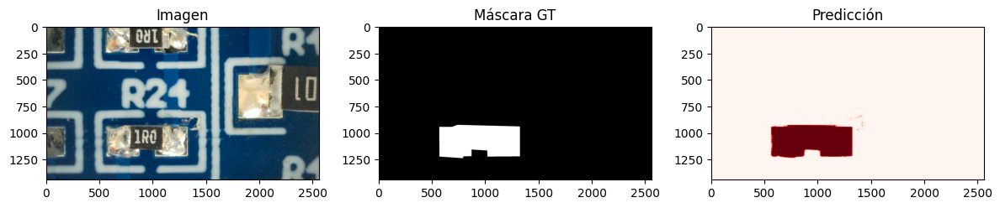

💾 Decoder guardado: sam_decoder_epoch48.pth

🔁 Epoch 49/50
  [Batch 0/14] Loss: 0.0064
  [Batch 10/14] Loss: 0.0076
✅ Epoch 49 finished. Avg Loss: 0.3164
📊 Métricas — IoU: 0.9615 | Dice: 0.9804 | Prec: 0.9849 | Rec: 0.9759


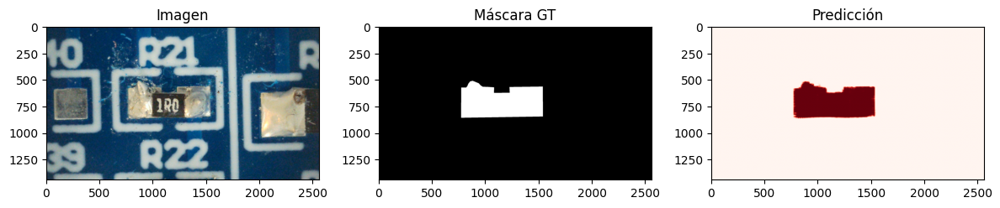

💾 Decoder guardado: sam_decoder_epoch49.pth

🔁 Epoch 50/50
  [Batch 0/14] Loss: 0.0109
  [Batch 10/14] Loss: 0.0052
✅ Epoch 50 finished. Avg Loss: 0.3557
📊 Métricas — IoU: 0.7977 | Dice: 0.8875 | Prec: 0.8338 | Rec: 0.9485


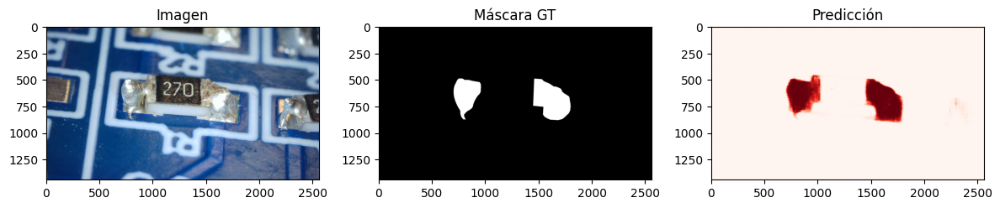

💾 Decoder guardado: sam_decoder_epoch50.pth
📁 Métricas guardadas en 'sam_decoder_metrics.csv'


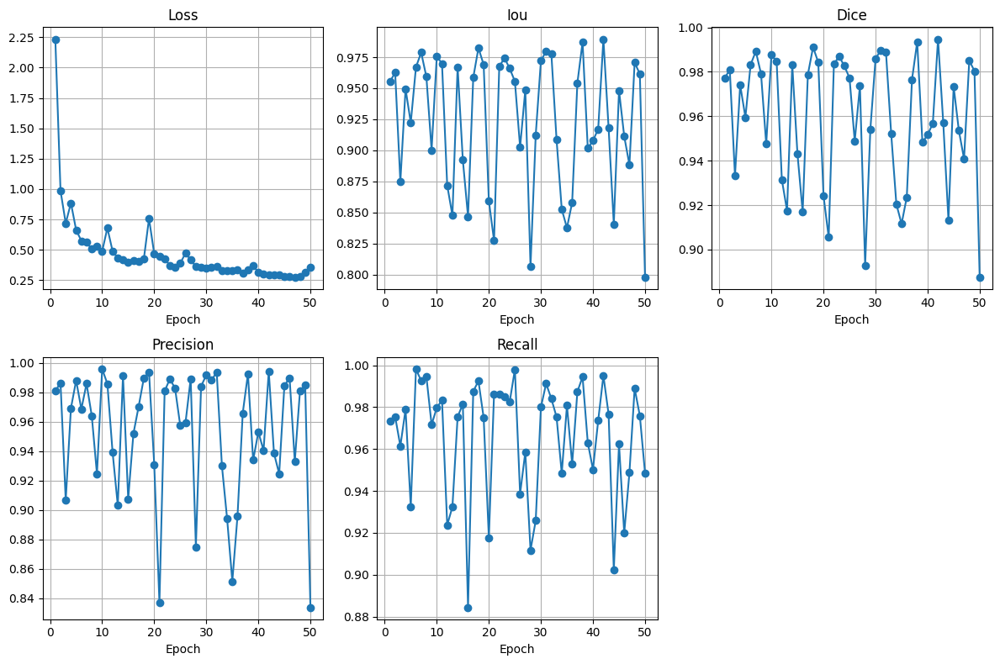

In [12]:
train_sam_decoder(sam, train_loader, epochs=50, lr=1e-4, device=DEVICE)



In [20]:
from google.colab import drive
drive.mount('/content/drive')

df.to_csv("/content/drive/MyDrive/sam_decoder_metrics.csv", index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


NameError: name 'df' is not defined

In [13]:
from segment_anything import SamPredictor
from torch.nn.functional import interpolate
import numpy as np
import matplotlib.pyplot as plt

def evaluate_sam_decoder(sam, dataloader, device="cuda"):
    sam.eval()
    predictor = SamPredictor(sam)
    all_metrics = []

    with torch.no_grad():
        for i, (images, masks_gt) in enumerate(dataloader):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = np.array([[point[1].item(), point[0].item()]], dtype=np.float32)
                point_labels = np.array([1], dtype=np.int32)

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                predictor.set_image(image_np)

                masks_pred, _, _ = predictor.predict(
                    point_coords=point_coords,
                    point_labels=point_labels,
                    multimask_output=False
                )

                pred = torch.tensor(masks_pred[0], dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
                mask_gt_resized = interpolate(mask_gt.unsqueeze(0), size=pred.shape[-2:], mode="bilinear")

                # === Métricas
                pred_bin = (pred > 0.5).float()
                gt_bin = (mask_gt_resized > 0.5).float()

                intersection = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
                pred_sum = pred_bin.sum().item()
                gt_sum = gt_bin.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                all_metrics.append([iou, dice, precision, recall])

    # === Promedios
    all_metrics = np.array(all_metrics)
    mean_iou = np.mean(all_metrics[:, 0])
    mean_dice = np.mean(all_metrics[:, 1])
    mean_prec = np.mean(all_metrics[:, 2])
    mean_rec = np.mean(all_metrics[:, 3])

    print("\n📊 Resultados promedio en validación:")
    print(f"IoU:  {mean_iou:.4f}")
    print(f"Dice: {mean_dice:.4f}")
    print(f"Prec: {mean_prec:.4f}")
    print(f"Rec:  {mean_rec:.4f}")


In [18]:
import torch, numpy as np
from tqdm import tqdm
from segment_anything import SamPredictor
from torch.nn.functional import interpolate

def evaluate_sam_pretrained(sam, dataloader, device="cuda"):
    sam.eval()
    sam.to(device)

    iou_list, dice_list, precision_list, recall_list = [], [], [], []
    predictor = SamPredictor(sam)

    with torch.no_grad():
        for images, masks_gt in tqdm(dataloader, desc="Evaluando SAM preentrenado"):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                mask_gt = masks_gt[b]
                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                # imagen en uint8 HWC
                image_np = images[b].permute(1, 2, 0).detach().cpu().numpy()
                image_np = (np.clip(image_np, 0, 1) * 255).astype(np.uint8)

                # prompt (centroide y etiqueta positiva)
                point = coords.float().mean(dim=0)
                point_coords = np.array([[point[1].item(), point[0].item()]], dtype=np.float32)
                point_labels = np.array([1], dtype=np.int32)

                predictor.set_image(image_np)
                masks_pred, _, _ = predictor.predict(
                    point_coords=point_coords, point_labels=point_labels, multimask_output=False
                )

                mask_pred_tensor = torch.tensor(masks_pred[0], dtype=torch.float32, device=device).unsqueeze(0).unsqueeze(0)
                mask_gt_resized = interpolate(mask_gt.unsqueeze(0), size=mask_pred_tensor.shape[-2:], mode="nearest")

                pred_bin = (mask_pred_tensor > 0.5).float()
                gt_bin = (mask_gt_resized > 0.5).float()

                intersection = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
                pred_sum = pred_bin.sum().item()
                gt_sum = gt_bin.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                iou_list.append(iou); dice_list.append(dice)
                precision_list.append(precision); recall_list.append(recall)

    if not iou_list:
        print("\n⚠️ No se evaluaron muestras válidas (todas sin máscara positiva).")
        return {"IoU":0.0,"Dice":0.0,"Prec":0.0,"Rec":0.0,"Images":0}

    print("\n📊 Resultados promedio sin fine-tuning:")
    print(f"IoU:  {np.mean(iou_list):.4f}")
    print(f"Dice: {np.mean(dice_list):.4f}")
    print(f"Prec: {np.mean(precision_list):.4f}")
    print(f"Rec:  {np.mean(recall_list):.4f}")

    return {
        "IoU": float(np.mean(iou_list)),
        "Dice": float(np.mean(dice_list)),
        "Prec": float(np.mean(precision_list)),
        "Rec": float(np.mean(recall_list)),
        "Images": len(iou_list)
    }



In [21]:
results_pre = evaluate_sam_pretrained(sam, val_loader, device="cuda")
print(results_pre)


NameError: name 'val_loader' is not defined

📊 Evaluando SAM preentrenado...


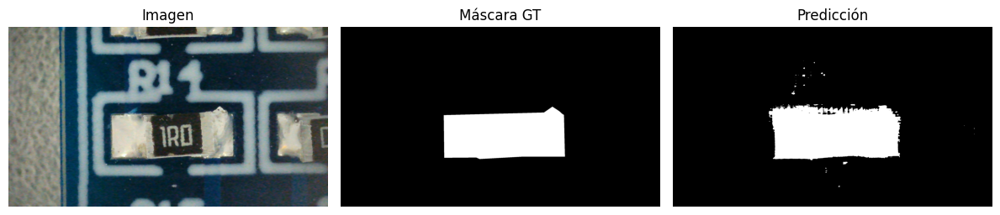

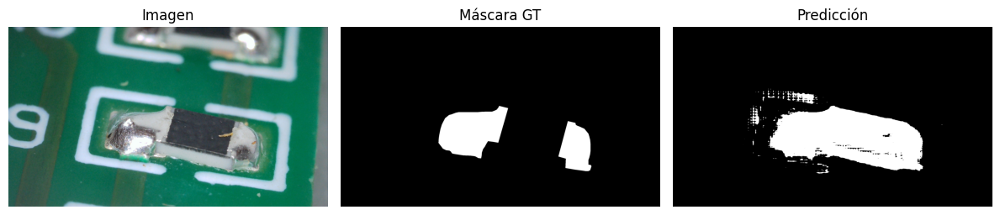

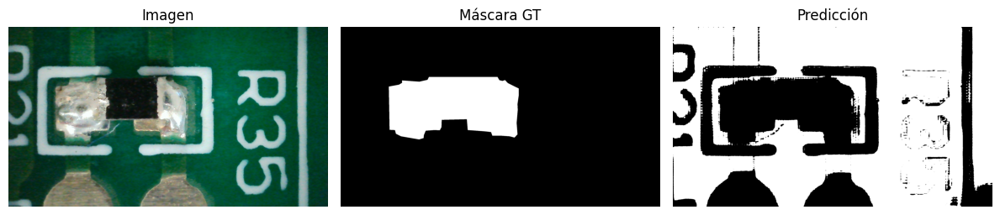

Resultados SIN fine-tuning: {'IoU': 0.24475567282727106, 'Dice': 0.32614314974328773, 'Prec': 0.2634251139327318, 'Rec': 0.4927572372598716, 'Images': 85}
📈 Evaluando SAM con fine-tuning...


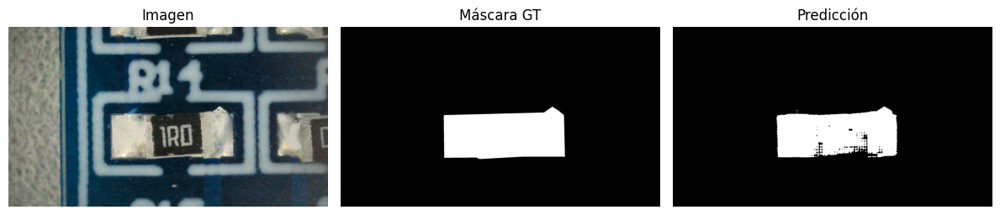

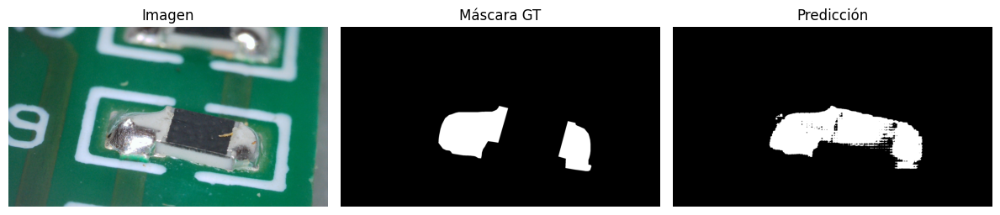

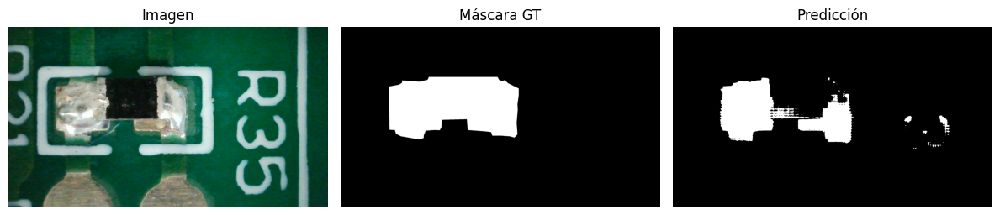

Resultados CON fine-tuning: {'IoU': 0.7279719221519411, 'Dice': 0.8229614948374473, 'Prec': 0.9300571018217957, 'Rec': 0.7737957894736422, 'Images': 85}


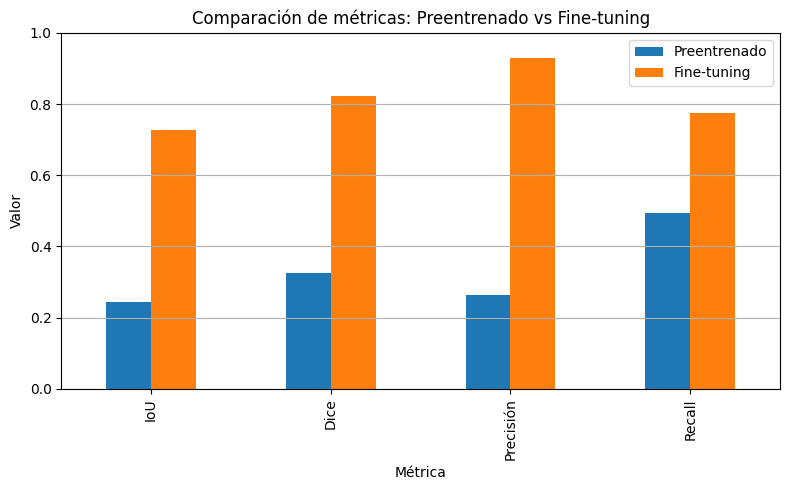

In [ ]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from PIL import Image
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

# === CONFIGURACIÓN ===
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
fine_tuned_decoder_path = "sam_decoder_epoch42.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"

# === EVALUACIÓN ===
def evaluar_sam(sam_model, dataloader, device="cuda", visualizar=False, max_visualizaciones=3):
    sam_model.eval()
    sam_model.to(device)

    total_iou = total_dice = total_precision = total_recall = total_imgs = 0
    visualizados = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = torch.tensor([[point[1].item(), point[0].item()]], dtype=torch.float32)
                point_labels = torch.tensor([1], dtype=torch.int)

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)
                coords_torch = point_coords.unsqueeze(0).to(device)
                labels_torch = point_labels.unsqueeze(0).to(device)

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=(coords_torch, labels_torch),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

                # === Visualización opcional ===
                if visualizar and visualizados < max_visualizaciones:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    axs[0].imshow(image_np)
                    axs[0].set_title("Imagen")
                    axs[1].imshow(mask_gt[0].cpu(), cmap="gray")
                    axs[1].set_title("Máscara GT")
                    axs[2].imshow(mask_pred_bin[0][0].cpu(), cmap="gray")
                    axs[2].set_title("Predicción")
                    for ax in axs:
                        ax.axis("off")
                    plt.tight_layout()
                    plt.show()
                    visualizados += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }

# === EVALUACIÓN PREENTRENADO ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("📊 Evaluando SAM preentrenado...")
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device, visualizar=True)
print("Resultados SIN fine-tuning:", result_pre)

# 🔁 Liberar memoria
del sam_pretrained
torch.cuda.empty_cache()

# === EVALUACIÓN FINE-TUNED ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
print("📈 Evaluando SAM con fine-tuning...")
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device, visualizar=True)
print("Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



📊 Resultados SIN fine-tuning: {'IoU': 0.24475567282727106, 'Dice': 0.32614314974328773, 'Prec': 0.2634251139327318, 'Rec': 0.4927572372598716, 'Images': 85}
📈 Resultados CON fine-tuning: {'IoU': 0.7279719221519411, 'Dice': 0.8229614948374473, 'Prec': 0.9300571018217957, 'Rec': 0.7737957894736422, 'Images': 85}


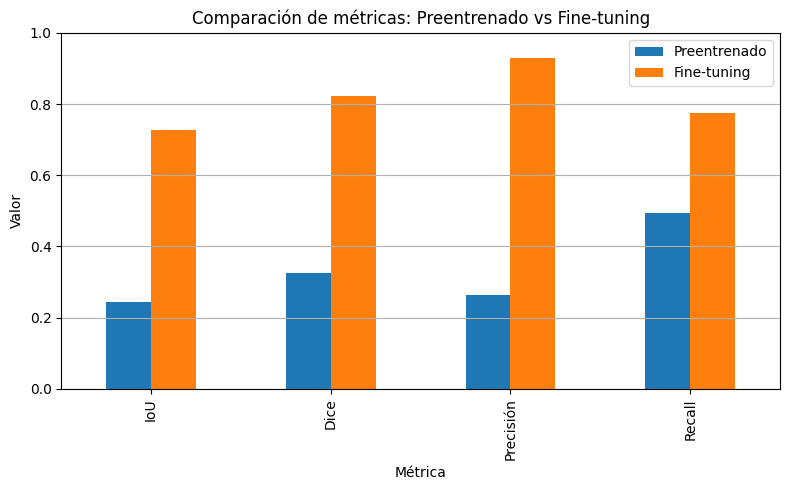

In [ ]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide
import numpy as np
import time
import os

# === CONFIGURACIÓN ===
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"  # checkpoint preentrenado
fine_tuned_decoder_path = "sam_decoder_epoch17.pth"    # decoder fine-tuned
device = "cuda" if torch.cuda.is_available() else "cpu"

# === FUNCIÓN DE EVALUACIÓN ===
def evaluar_sam(sam_model, dataloader, device="cuda"):
    sam_model.eval()
    sam_model.to(device)

    total_iou = 0
    total_dice = 0
    total_precision = 0
    total_recall = 0
    total_imgs = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = torch.tensor([[point[1].item(), point[0].item()]], dtype=torch.float32)
                point_labels = torch.tensor([1], dtype=torch.int)

                # === Procesar imagen y redimensionar a 1024x1024 ===
                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)
                coords_torch = point_coords.unsqueeze(0).to(device)
                labels_torch = point_labels.unsqueeze(0).to(device)

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=(coords_torch, labels_torch),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                # === Métricas
                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


# === 1️⃣ Evaluación sin fine-tuning ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device)
print("📊 Resultados SIN fine-tuning:", result_pre)

# === 2️⃣ Evaluación con fine-tuning ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device)
print("📈 Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



In [ ]:
def resumen_modelo(model, name="SAM"):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"📦 {name}: {trainable:,} / {total:,} parámetros entrenables")

# Verifica ambos modelos
resumen_modelo(sam_pretrained, "SAM Preentrenado")
resumen_modelo(sam_finetuned, "SAM Fine-tuned")


📦 SAM Preentrenado: 93,735,472 / 93,735,472 parámetros entrenables
📦 SAM Fine-tuned: 93,735,472 / 93,735,472 parámetros entrenables


In [ ]:
def evaluar_sam(sam_model, dataloader, device="cuda", tipo_prompt="point", visualizar=False, max_visualizaciones=3):
    from matplotlib.patches import Rectangle

    sam_model.eval()
    sam_model.to(device)

    total_iou = total_dice = total_precision = total_recall = total_imgs = 0
    visualizados = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                point_coords, point_labels, box = generar_prompts(mask_gt, tipo=tipo_prompt)
                if point_coords is not None:
                    point_coords_vis = point_coords.clone().cpu()
                    point_coords = point_coords.unsqueeze(0).to(device)
                    point_labels = point_labels.unsqueeze(0).to(device)
                else:
                    point_coords_vis = None
                    point_coords = point_labels = None

                if box is not None:
                    box_vis = box.clone().cpu()
                    box = box.to(device)
                else:
                    box_vis = None

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)

                # ✅ Corrección aquí
                if point_coords is not None and point_labels is not None:
                    points = (point_coords, point_labels)
                else:
                    points = None

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=points,
                    boxes=box,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

                if visualizar and visualizados < max_visualizaciones:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    axs[0].imshow(image_np)
                    axs[0].set_title("Imagen + Prompt")

                    if point_coords_vis is not None:
                        for x, y in point_coords_vis:
                            axs[0].scatter(x.item(), y.item(), color="lime", s=40)

                    if box_vis is not None:
                        x0, y0, x1, y1 = box_vis[0]
                        axs[0].add_patch(Rectangle((x0.item(), y0.item()), (x1 - x0).item(), (y1 - y0).item(),
                                                   edgecolor="red", facecolor="none", lw=2))

                    axs[1].imshow(mask_gt[0].cpu(), cmap="gray")
                    axs[1].set_title("Máscara GT")
                    axs[2].imshow(mask_pred_bin[0][0].cpu(), cmap="gray")
                    axs[2].set_title("Predicción")
                    for ax in axs:
                        ax.axis("off")
                    plt.tight_layout()
                    plt.show()
                    visualizados += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


def evaluar_por_prompt(sam_model, dataloader, tipos_prompt=["point", "multi_point", "box", "box_point"], device="cuda", visualizar=False, max_visualizaciones=2):
    resultados = {}

    for tipo in tipos_prompt:
        print(f"\n📌 Evaluando con prompt: {tipo}")
        res = evaluar_sam(
            sam_model,
            dataloader,
            device=device,
            tipo_prompt=tipo,
            visualizar=visualizar,
            max_visualizaciones=max_visualizaciones
        )
        resultados[tipo] = res
        print(f"→ IoU:   {res['IoU']:.4f}")
        print(f"→ Dice:  {res['Dice']:.4f}")
        print(f"→ Prec:  {res['Prec']:.4f}")
        print(f"→ Rec:   {res['Rec']:.4f}")

    return resultados



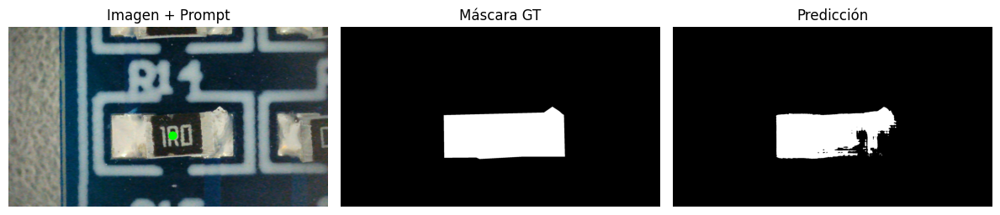

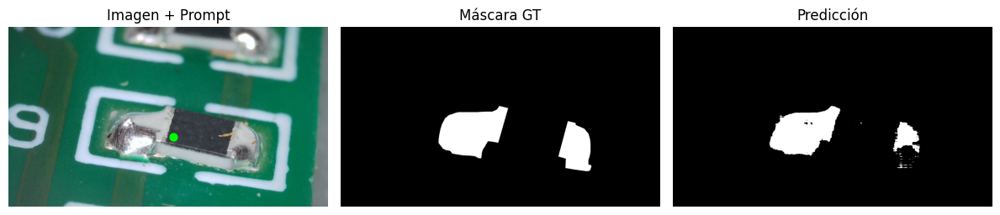

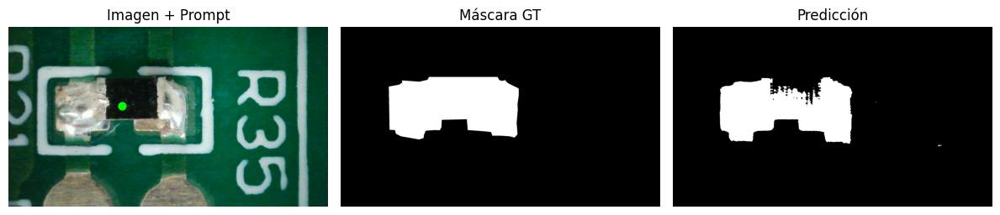

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="point", visualizar=True)


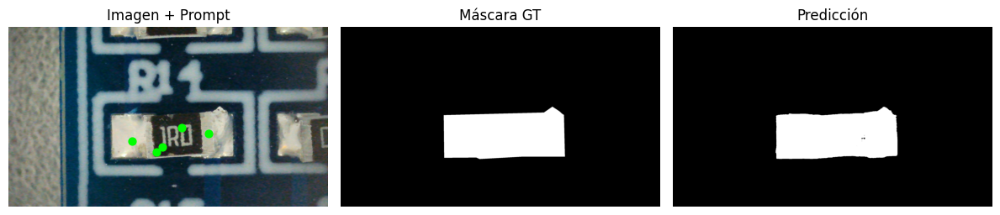

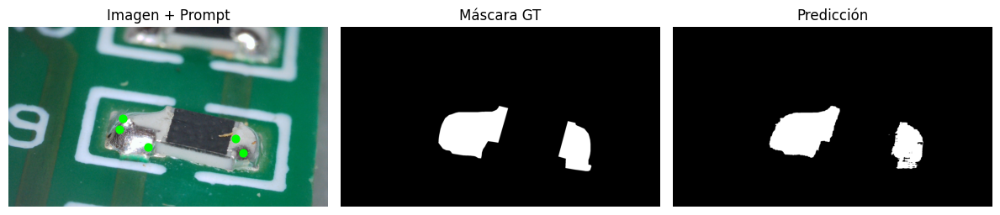

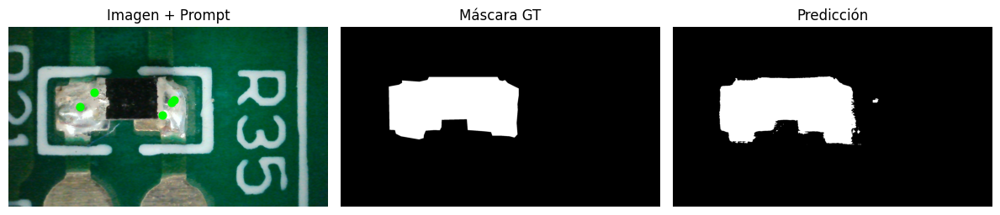

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="multi_point", visualizar=True)

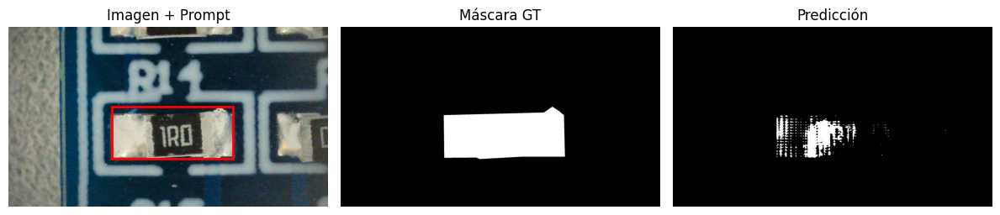

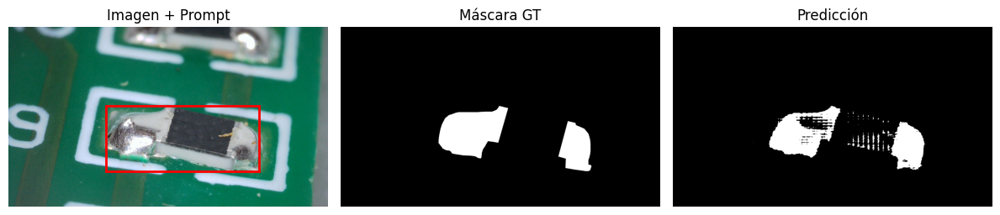

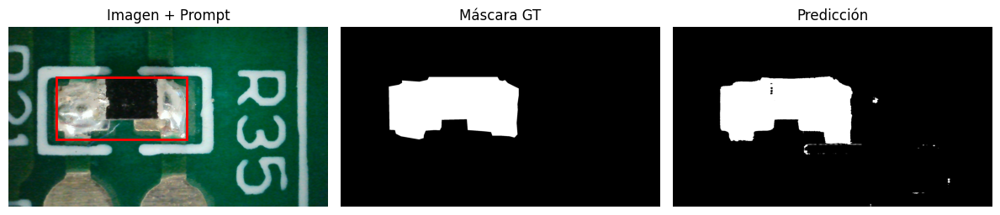

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="box", visualizar=True)

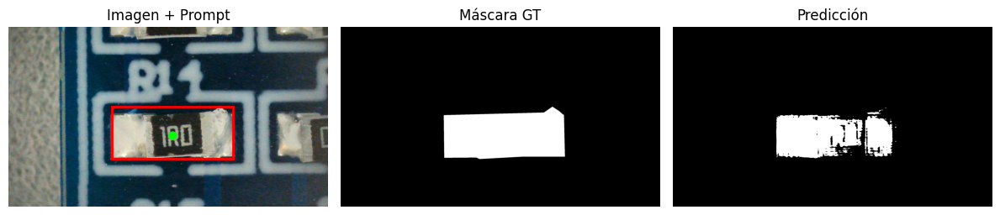

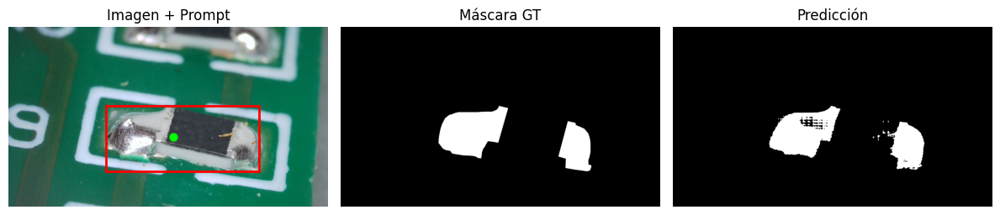

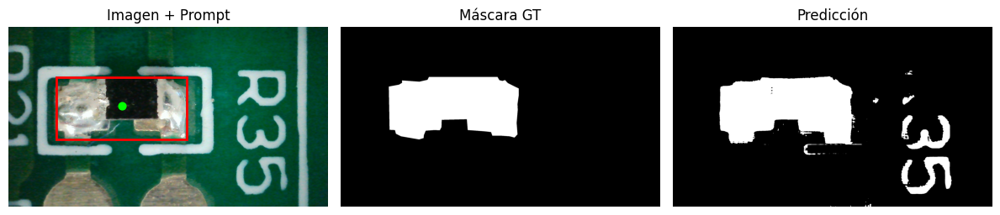

In [ ]:
from segment_anything import sam_model_registry

sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
decoder_path = "sam_decoder_epoch17.pth"  # Usa tu ruta real

sam_model = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_model.mask_decoder.load_state_dict(torch.load(decoder_path, map_location=device))

result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)


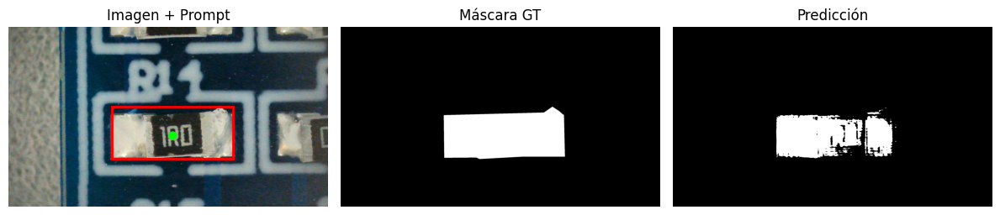

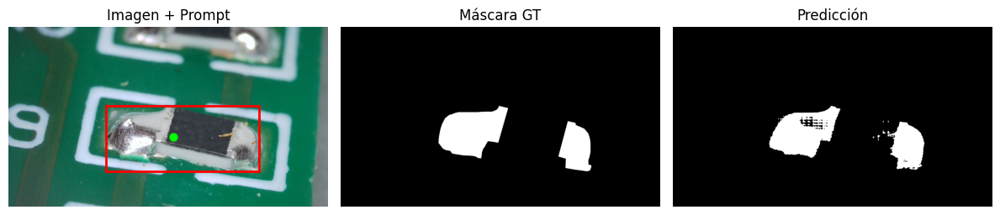

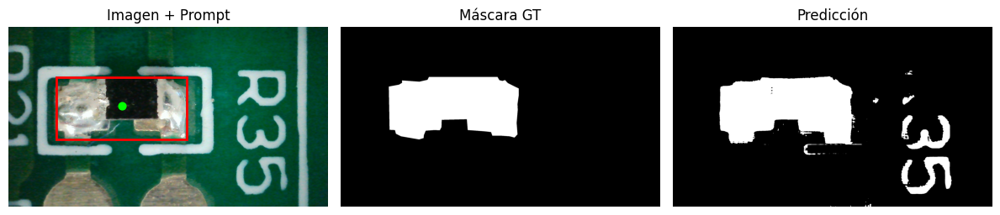

In [ ]:
result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)



📌 Evaluando con prompt: point


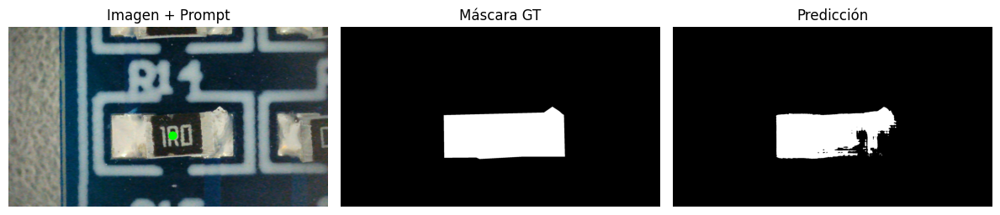

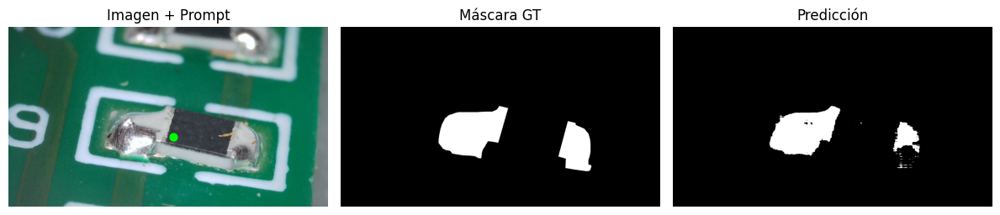

→ IoU:   0.8613
→ Dice:  0.9218
→ Prec:  0.9503
→ Rec:   0.9019

📌 Evaluando con prompt: multi_point


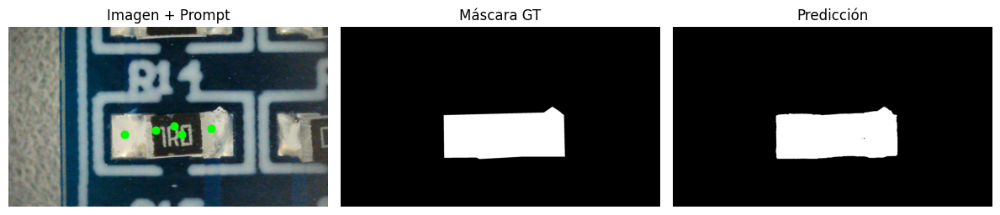

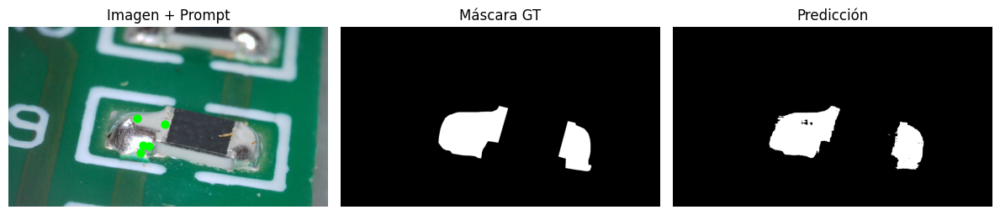

→ IoU:   0.8830
→ Dice:  0.9341
→ Prec:  0.9395
→ Rec:   0.9317

📌 Evaluando con prompt: box


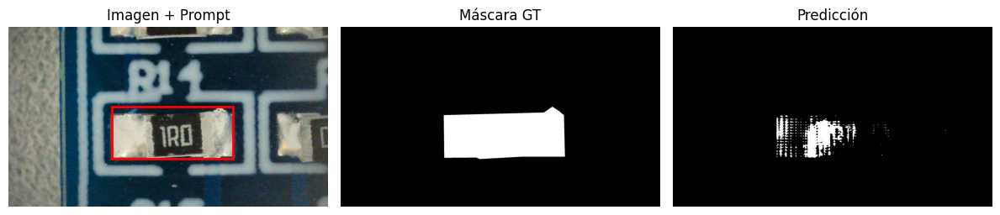

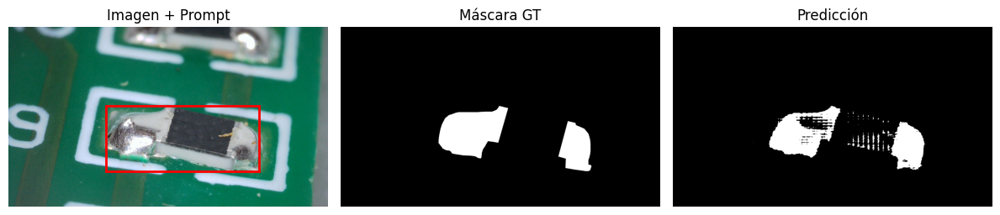

→ IoU:   0.7255
→ Dice:  0.8123
→ Prec:  0.8755
→ Rec:   0.8102

📌 Evaluando con prompt: box_point


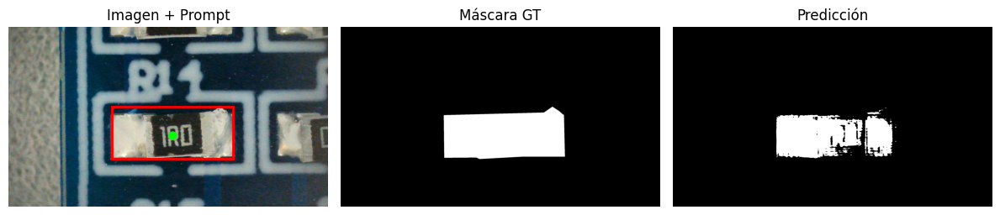

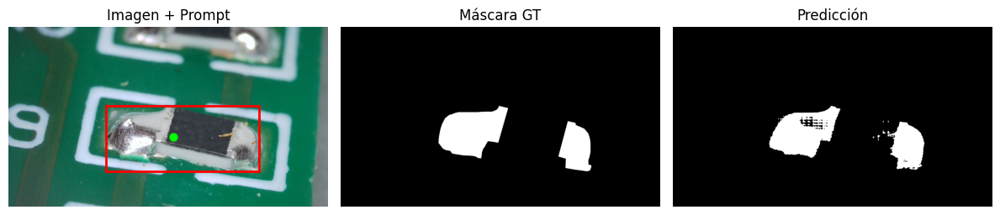

→ IoU:   0.8225
→ Dice:  0.8936
→ Prec:  0.8882
→ Rec:   0.9205

📊 Tabla comparativa de métricas:

                IoU    Dice    Prec     Rec
point        0.8613  0.9218  0.9503  0.9019
multi_point  0.8830  0.9341  0.9395  0.9317
box          0.7255  0.8123  0.8755  0.8102
box_point    0.8225  0.8936  0.8882  0.9205


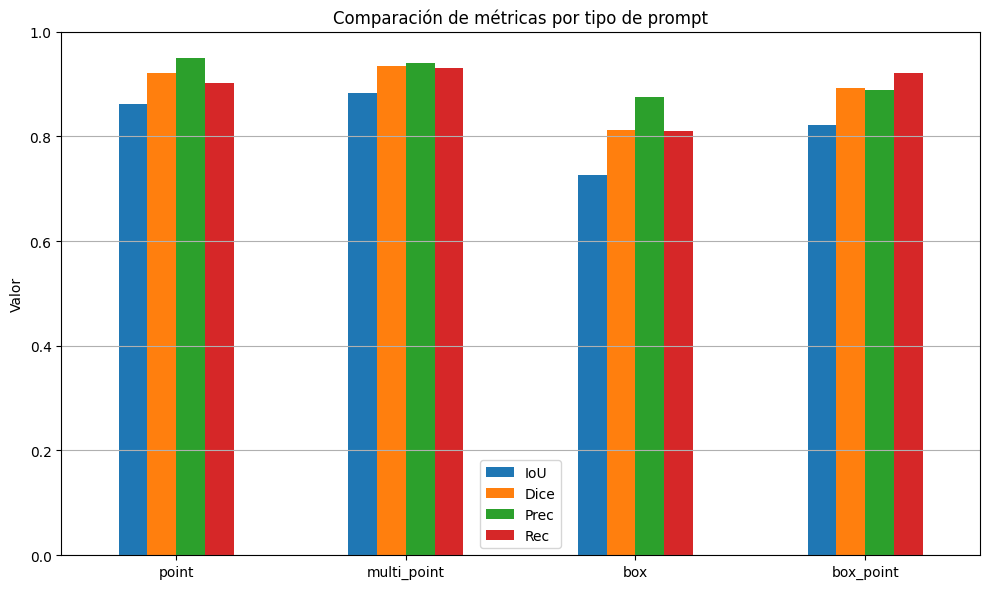

In [ ]:
# === Uso ===
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))

resultados_por_prompt = evaluar_por_prompt(sam, val_loader, device=device, visualizar=True)

# === Visualización gráfica ===
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(resultados_por_prompt).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas:\n")
print(df.round(4))

df.plot(kind="bar", figsize=(10, 6))
plt.title("Comparación de métricas por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


📌 Evaluando con prompt: point


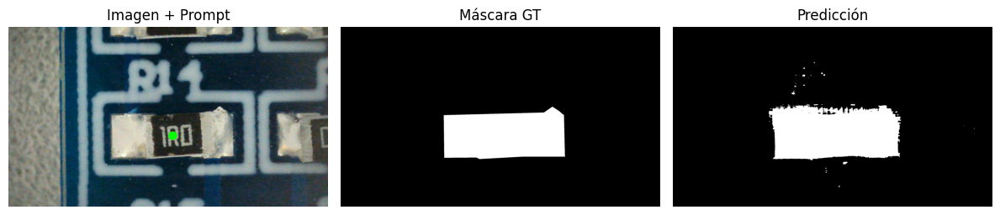

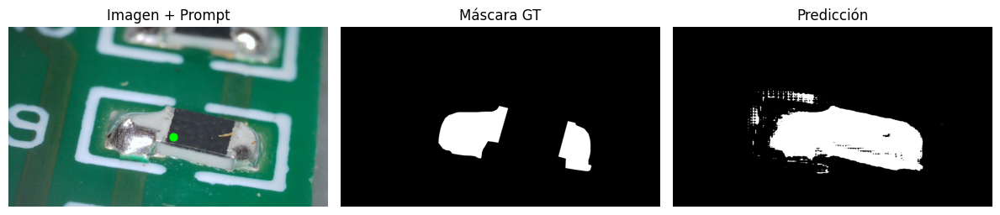

→ IoU:   0.2448
→ Dice:  0.3261
→ Prec:  0.2634
→ Rec:   0.4928

📌 Evaluando con prompt: multi_point


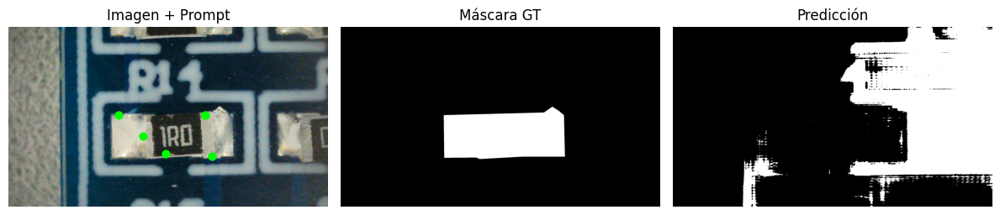

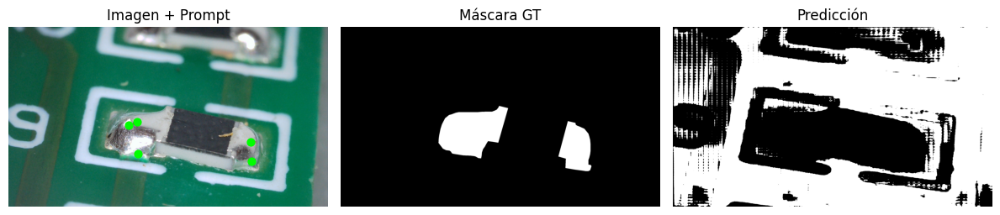

→ IoU:   0.0546
→ Dice:  0.0846
→ Prec:  0.0603
→ Rec:   0.2023

📌 Evaluando con prompt: box


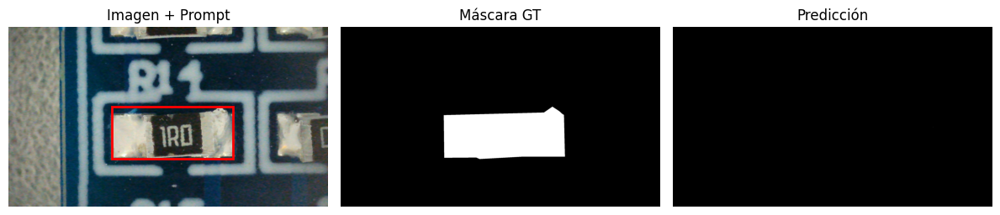

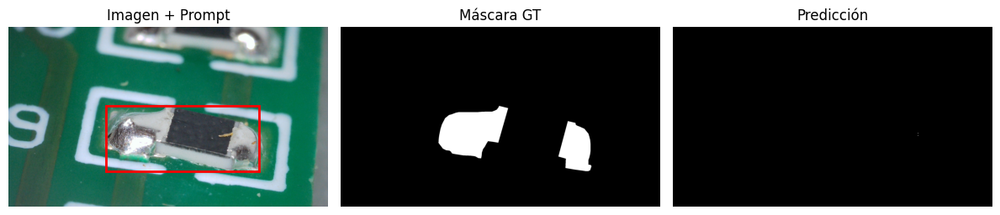

→ IoU:   0.0070
→ Dice:  0.0122
→ Prec:  0.2984
→ Rec:   0.0071

📌 Evaluando con prompt: box_point


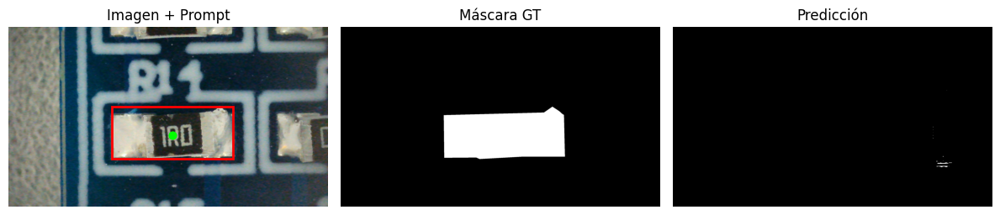

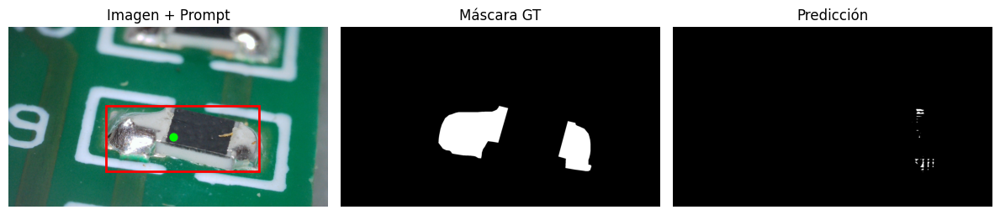

→ IoU:   0.0158
→ Dice:  0.0263
→ Prec:  0.1703
→ Rec:   0.0189

📊 Tabla comparativa de métricas (SAM sin fine-tuning):

                IoU    Dice    Prec     Rec
point        0.2448  0.3261  0.2634  0.4928
multi_point  0.0546  0.0846  0.0603  0.2023
box          0.0070  0.0122  0.2984  0.0071
box_point    0.0158  0.0263  0.1703  0.0189


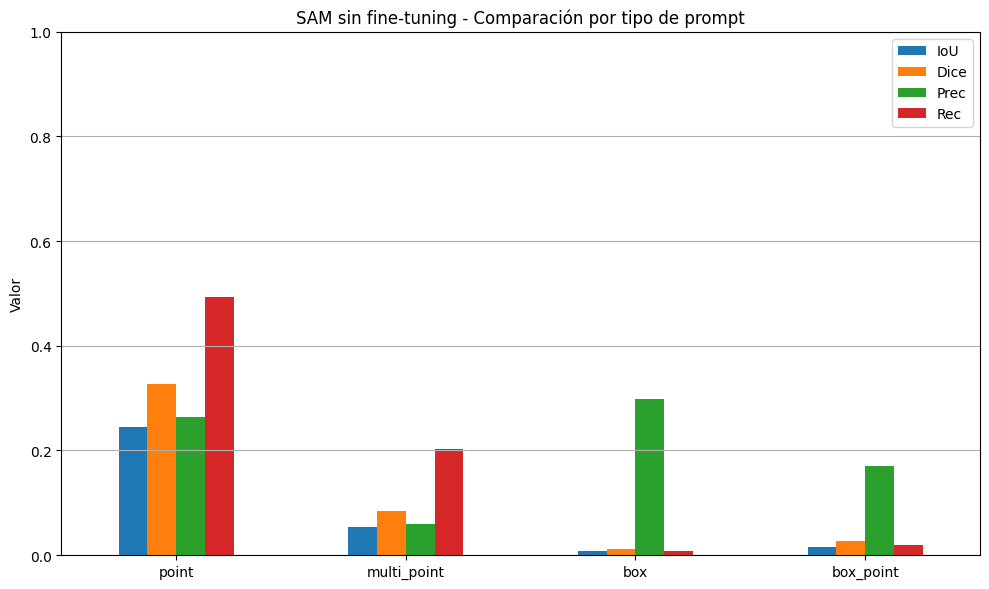

In [ ]:
# === Modelo preentrenado (SIN cargar decoder fine-tuned) ===
sam_pretrained = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)

# === Evaluación con distintos tipos de prompt ===
resultados_por_prompt_pre = evaluar_por_prompt(sam_pretrained, val_loader, device=device, visualizar=True)

# === Visualización de métricas ===
import pandas as pd
import matplotlib.pyplot as plt

df_pre = pd.DataFrame(resultados_por_prompt_pre).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas (SAM sin fine-tuning):\n")
print(df_pre.round(4))

df_pre.plot(kind="bar", figsize=(10, 6))
plt.title("SAM sin fine-tuning - Comparación por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
